# Visualization of Gradient Descent in Neural Networks

**Effectively visualizing the path that optimization algorithms take through the loss landscape of neural networks**

| Part | Topic | Key Question |
|------|-------|-------------|
| **1** | Convex Landscape (Logistic Regression) | Do different seeds converge to the same minimum? |
| **2** | Non-Convex Landscape (Two-Layer MLP) | Do different seeds find different local minima? |
| **4** | 2D Ground Truth Model | What does a perfect landscape look like? + Optimizer Comparison |



# Theoretical Background: 

## Dimensionality Reduction Methods

When training a neural network, the weight vector $\boldsymbol{\theta} \in \mathbb{R}^D$ lives in a very high-dimensional space. To visualize how gradient descent navigates the loss landscape, we must project these trajectories down to 2D. Below are two methods we compare.

---

## 1. Principal Component Analysis (PCA)

**Type:** Linear | **Preserves:** Global variance

PCA finds the orthogonal directions of maximum variance: $\max_{\mathbf{u}} \text{Var}(\mathbf{X}\mathbf{u})$ s.t. $\|\mathbf{u}\| = 1$

**Pros:** Fast, deterministic, interpretable axes (variance explained).
**Cons:** Cannot capture non-linear manifold structure.

## 2. Isomap (Isometric Feature Mapping)

**Type:** Non-linear | **Preserves:** Geodesic distances

Builds a k-NN graph, computes shortest-path distances between all pairs, then applies classical MDS on the geodesic distance matrix.

**Pros:** Preserves true manifold geometry.
**Cons:** Sensitive to `n_neighbors`, computationally heavier.

| Method | Type | Preserves | Speed | Deterministic |
|--------|------|-----------|-------|---------------|
| PCA | Linear | Global variance | Fast | Yes |
| Isomap | Non-linear | Geodesic distances | Medium | Yes |


---


In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

from sklearn.datasets import make_classification
from torch.utils.data import TensorDataset, DataLoader
from sklearn.decomposition import PCA
from sklearn.manifold import Isomap
from sklearn.neighbors import KNeighborsRegressor

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px


import copy
import warnings

import random

import warnings
from scipy.sparse import SparseEfficiencyWarning
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", SparseEfficiencyWarning)



print("All libraries imported successfully")

All libraries imported successfully


In [2]:

# --- IMPORTED MISSING METHODS ---
def get_flat_params(model):
    return torch.cat([p.detach().cpu().flatten() for p in model.parameters()])

def set_flat_params(model, flat_tensor):
    offset = 0
    for p in model.parameters():
        numel = p.numel()
        p.data.copy_(flat_tensor[offset:offset+numel].view(p.shape).to(p.device))
        offset += numel

# ===========================================================================
# ===========================================================================
#  TRAINING WITH TRAJECTORY COLLECTION
# ===========================================================================
# ===========================================================================

def train_model(model, dataloader, epochs=100, lr=0.05, optimizer_name='SGD'):
    if optimizer_name == 'SGD':
        opt = optim.SGD(model.parameters(), lr=lr)
    elif optimizer_name == 'SGD_momentum':
        opt = optim.SGD(model.parameters(), lr=lr, momentum=0.9)
    elif optimizer_name == 'Adam':
        opt = optim.Adam(model.parameters(), lr=lr)
    else:
        raise ValueError(f"Unknown optimizer: {optimizer_name}")
    criterion = nn.BCEWithLogitsLoss()
    trajectory = [get_flat_params(model).clone()]
    loss_history = []
    for epoch in range(epochs):
        epoch_loss = 0.0
        for X_batch, y_batch in dataloader:
            opt.zero_grad()
            logits = model(X_batch)
            loss = criterion(logits, y_batch)
            loss.backward()
            opt.step()
            epoch_loss += loss.item()
        loss_history.append(epoch_loss / len(dataloader))
        trajectory.append(get_flat_params(model).clone())
    return trajectory, loss_history

def train_multiple_seeds(model_class, model_kwargs, dataloader, seeds, **train_kwargs):
    results = {}
    for seed in seeds:
        torch.manual_seed(seed)
        np.random.seed(seed)
        model = model_class(**model_kwargs)
        traj, losses = train_model(model, dataloader, **train_kwargs)
        results[seed] = {'trajectory': traj, 'losses': losses, 'model': copy.deepcopy(model)}
        print(f"  Seed {seed}: Final Loss = {losses[-1]:.6f}")
    return results

# ===========================================================================
#  PCA PROJECTION (centered at final weights, with filter normalization)
# ===========================================================================

def pca_project(trajectory, model):
    traj_tensor = torch.stack(trajectory)
    final_theta = traj_tensor[-1].clone()
    centred = traj_tensor - final_theta
    pca = PCA(n_components=2)
    pca.fit(centred.numpy())
    components = torch.from_numpy(pca.components_).float()
    u_raw, v_raw = components[0], components[1]
    u, v = u_raw, v_raw
    coords = torch.zeros(len(trajectory), 2)
    for t in range(len(trajectory)):
        diff = traj_tensor[t] - final_theta
        coords[t, 0] = torch.dot(diff, u)
        coords[t, 1] = torch.dot(diff, v)
    return coords, u, v, final_theta, pca.explained_variance_ratio_

# ===========================================================================
#  LOSS SURFACE COMPUTATION
# ===========================================================================

def compute_loss_surface(model, X, y, final_theta, u, v, resolution=40, vis_range=1.0):
    alphas = np.linspace(-vis_range, vis_range, resolution)
    betas = np.linspace(-vis_range, vis_range, resolution)
    alpha_grid, beta_grid = np.meshgrid(alphas, betas)
    Z = np.zeros_like(alpha_grid)
    criterion = nn.BCEWithLogitsLoss()
    original = get_flat_params(model).clone()
    model.eval()  # Lock the model for evaluation (disable dropouts/batchnorm)
    for i in range(resolution):
        for j in range(resolution):
            theta_new = final_theta + alpha_grid[i,j] * u + beta_grid[i,j] * v
            set_flat_params(model, theta_new)
            with torch.no_grad():
                Z[i,j] = criterion(model(X), y).item()
    set_flat_params(model, original)
    return alpha_grid, beta_grid, Z

# ===========================================================================

def hessian_vector_product(model, X, y, vec):
    criterion = nn.BCEWithLogitsLoss()
    model.zero_grad()
    loss = criterion(model(X), y)
    grads = torch.autograd.grad(loss, model.parameters(), create_graph=True)
    flat_grad = torch.cat([g.reshape(-1) for g in grads])
    gv = torch.dot(flat_grad, vec)
    hv_parts = torch.autograd.grad(gv, model.parameters())
    return torch.cat([h.reshape(-1) for h in hv_parts]).detach()

def power_iteration(model, X, y, num_iters=20):
    D = sum(p.numel() for p in model.parameters())
    v = torch.randn(D); v = v / torch.norm(v)
    eigenvalue = 0.0
    for _ in range(num_iters):
        hv = hessian_vector_product(model, X, y, v)
        eigenvalue = torch.dot(v, hv).item()
        v = hv / (torch.norm(hv) + 1e-12)
    return eigenvalue

def compute_eigenvalues_along_trajectory(model, X, y, trajectory, sample_every=10):
    original = get_flat_params(model).clone()
    sampled = {}
    for t in range(0, len(trajectory), sample_every):
        set_flat_params(model, trajectory[t])
        sampled[t] = power_iteration(model, X, y)
    set_flat_params(model, original)
    keys = sorted(sampled.keys())
    eigenvalues = []
    for t in range(len(trajectory)):
        if t in sampled:
            eigenvalues.append(sampled[t])
        else:
            lo = max(k for k in keys if k <= t)
            hi = min((k for k in keys if k > t), default=lo)
            frac = (t - lo) / (hi - lo) if hi != lo else 0
            eigenvalues.append(sampled[lo]*(1-frac) + sampled[hi]*frac)
    return eigenvalues

# ===========================================================================




In [3]:
# helper function for animation controls
def add_animation_controls(fig, num_frames, title_text, width=1100, height=750, **layout_kwargs):
    """
    Automatically builds and attaches Play/Pause buttons and Epoch sliders 
    to a Plotly animation figure, reducing boilerplate code.
    """
    # 1. Build the steps for the slider
    steps = [
        {
            'args': [[str(i)], {'frame': {'duration': 0, 'redraw': True},
                              'mode': 'immediate',
                              'transition': {'duration': 0}}],
            'method': 'animate',
            'label': str(i)
        }
        for i in range(num_frames)
    ]
    
    # 2. Build the slider
    sliders = [{
        'active': 0, 'yanchor': 'top', 'y': 0, 'xanchor': 'left', 'x': 0.15,
        'currentvalue': {'prefix': '<b>Epoch: </b>', 'visible': True, 'xanchor': 'center', 'font': {'size': 16}},
        'pad': {'b': 10, 't': 50}, 'len': 0.75, 'transition': {'duration': 0},
        'steps': steps
    }]
    
    # 3. Build the Play/Pause buttons
    updatemenus = [{
        'type': 'buttons', 'direction': 'left',
        'buttons': [
            {'args': [None, {'frame': {'duration': 150, 'redraw': True}, 'fromcurrent': True, 'transition': {'duration': 75, 'easing': 'linear'}}], 'label': '▶ Play', 'method': 'animate'},
            {'args': [[None], {'frame': {'duration': 0, 'redraw': True}, 'mode': 'immediate', 'transition': {'duration': 0}}], 'label': '⏸ Pause', 'method': 'animate'}
        ],
        'pad': {'t': 87}, 'showactive': False, 'x': 0.0, 'y': 0, 'xanchor': 'left', 'yanchor': 'top'
    }]
    
    # 4. Apply to the figure
    fig.update_layout(
        title=title_text,
        sliders=sliders,
        updatemenus=updatemenus,
        width=width,
        height=height,
        hovermode='closest',
        **layout_kwargs # Applies any extra custom layouts like 3D cameras we pass in!
    )
    
    return fig

In [4]:
# helper functions for visualizations
def eval_loss_for_weight_vector(w_flat, model_template, X, y, criterion):
    w_tensor = torch.from_numpy(w_flat).float()
    start = 0; w1_size = 200; b1_size = 10; w2_size = 10; b2_size = 1
    with torch.no_grad():
        model_template.layer1.weight.copy_(w_tensor[start:start + w1_size].view(10, 20)); start += w1_size
        model_template.layer1.bias.copy_(w_tensor[start:start + b1_size]); start += b1_size
        model_template.layer2.weight.copy_(w_tensor[start:start + w2_size].view(1, 10)); start += w2_size
        model_template.layer2.bias.copy_(w_tensor[start:start + b2_size])
        pred = model_template(X)
        return criterion(pred, y).item()

def get_loss_at_pca_coord_nn(pca_coord, pca_m, model_template, X, y, criterion):
    w_high_d = pca_m.inverse_transform(pca_coord.reshape(1, -1)).flatten()
    return eval_loss_for_weight_vector(w_high_d, model_template, X, y, criterion)

def plot_landscape_dashboard(selected_seeds, title_text):
    print(f"\n--- Processing {len(selected_seeds)} Seeds ---")
    all_weights = np.vstack([mlp_training_histories[s]['weights'] for s in selected_seeds])
    
    # 1. Dimensionality Reduction
    pca = PCA(n_components=2)
    pca.fit(all_weights)
    iso = Isomap(n_neighbors=10, n_components=2)
    all_weights_iso = iso.fit_transform(all_weights)
    
    print(f"PCA Variance Captured: {np.sum(pca.explained_variance_ratio_)*100:.2f}%")
    print(f"Isomap Reconstruction Error: {iso.reconstruction_error():.4f}")
    
    
    # 2. Assign paths locally
    local_paths = {}
    start_idx = 0
    for s in selected_seeds:
        n = len(mlp_training_histories[s]['weights'])
        local_paths[s] = {
            'path_2d': pca.transform(mlp_training_histories[s]['weights']),
            'path_iso': all_weights_iso[start_idx:start_idx + n]
        }
        start_idx += n

    # 3. Compute Grids & Surfaces
    margin = 0.5
    grid_res = 20
    template_nn = SimpleNN(features_logistic.shape[1])
    
    # PCA Grid
    projected_2d_paths = np.vstack([local_paths[s]['path_2d'] for s in selected_seeds])
    x_pca_1d = np.linspace(projected_2d_paths[:, 0].min() - margin, projected_2d_paths[:, 0].max() + margin, grid_res)
    y_pca_1d = np.linspace(projected_2d_paths[:, 1].min() - margin, projected_2d_paths[:, 1].max() + margin, grid_res)
    X_pca, Y_pca = np.meshgrid(x_pca_1d, y_pca_1d)
    Z_pca = np.zeros((grid_res, grid_res))
    for i in range(grid_res):
        for j in range(grid_res):
            Z_pca[i, j] = get_loss_at_pca_coord_nn(np.array([X_pca[i, j], Y_pca[i, j]]), pca, template_nn, features_logistic_tensor, labels_logistic_tensor, criterion_nn)

    # Isomap Grid (KNN)
    all_losses = np.array([eval_loss_for_weight_vector(w, template_nn, features_logistic_tensor, labels_logistic_tensor, criterion_nn) for w in all_weights])
    all_paths_iso_stacked = np.vstack([local_paths[s]['path_iso'] for s in selected_seeds])
    x_iso_1d = np.linspace(all_paths_iso_stacked[:, 0].min() - margin, all_paths_iso_stacked[:, 0].max() + margin, grid_res)
    y_iso_1d = np.linspace(all_paths_iso_stacked[:, 1].min() - margin, all_paths_iso_stacked[:, 1].max() + margin, grid_res)
    X_iso, Y_iso = np.meshgrid(x_iso_1d, y_iso_1d)
    knn_iso = KNeighborsRegressor(n_neighbors=10, weights="distance").fit(all_paths_iso_stacked, all_losses)
    Z_iso = knn_iso.predict(np.column_stack([X_iso.ravel(), Y_iso.ravel()])).reshape(X_iso.shape)

    # 4. Plotting the 2x3 Dashboard
    fig = make_subplots(
        rows=2, cols=3, 
        specs=[[{"type": "scene"}, {"type": "xy"}, {"type": "xy"}], 
               [{"type": "scene"}, {"type": "xy"}, {"type": "xy"}]], 
        subplot_titles=("PCA 3D Surface", "PCA Contour Map", "PCA Loss (Solid) vs True (Dashed)",
                        "Isomap 3D Surface", "Isomap Contour Map", "Isomap Loss (Solid) vs True (Dashed)"),
        column_widths=[0.4, 0.3, 0.3],
        vertical_spacing=0.1
    )

    # Add Surfaces
    fig.add_trace(go.Surface(x=X_pca, y=Y_pca, z=Z_pca, colorscale="Viridis", opacity=0.8, showscale=False), row=1, col=1)
    fig.add_trace(go.Contour(x=x_pca_1d, y=y_pca_1d, z=Z_pca, colorscale="Viridis", opacity=0.8, showscale=False), row=1, col=2)
    
    fig.add_trace(go.Surface(x=X_iso, y=Y_iso, z=Z_iso, colorscale="Viridis", opacity=0.8, showscale=False), row=2, col=1)
    fig.add_trace(go.Contour(x=x_iso_1d, y=y_iso_1d, z=Z_iso, colorscale="Viridis", opacity=0.8, showscale=False), row=2, col=2)

    color_palette = px.colors.qualitative.Light24
    arrow_colors = ['darkred', 'darkblue', 'darkgreen', 'purple', 'orange', 'brown', 'pink', 'gray',
                    'olive', 'cyan', 'magenta', 'navy', 'teal', 'maroon', 'lime', 'indigo',
                    'khaki', 'coral', 'salmon', 'gold', 'tomato', 'turquoise', 'violet', 'sienna']
    
    for i, seed in enumerate(selected_seeds):
        p_pca = local_paths[seed]['path_2d']
        p_iso = local_paths[seed]['path_iso']
        c = color_palette[i % len(color_palette)]
        arrow_c = arrow_colors[i % len(arrow_colors)]
        
        # True loss
        z_true = [eval_loss_for_weight_vector(w, template_nn, features_logistic_tensor, labels_logistic_tensor, criterion_nn) for w in mlp_training_histories[seed]['weights']]
        
        # --- PCA ROW (Row 1) ---
        z_pca_proj = [get_loss_at_pca_coord_nn(p_pca[j], pca, template_nn, features_logistic_tensor, labels_logistic_tensor, criterion_nn) for j in range(len(z_true))]
        
        # 3D
        fig.add_trace(go.Scatter3d(x=p_pca[:, 0], y=p_pca[:, 1], z=z_pca_proj, mode='lines', line=dict(color=c, width=3), opacity=0.6, showlegend=False), row=1, col=1)
        fig.add_trace(go.Scatter3d(x=p_pca[:, 0], y=p_pca[:, 1], z=z_true, mode='lines', line=dict(color=c, width=5, dash='dash'), showlegend=False), row=1, col=1)
        
        # Contour + Markers
        fig.add_trace(go.Scatter(x=p_pca[:, 0], y=p_pca[:, 1], mode='lines', line=dict(color=c, width=2), showlegend=False), row=1, col=2)
        fig.add_trace(go.Scatter(x=[p_pca[0, 0]], y=[p_pca[0, 1]], mode='markers', marker=dict(color='lime', size=8, symbol='star', line=dict(color='black', width=1)), showlegend=False), row=1, col=2)
        fig.add_trace(go.Scatter(x=[p_pca[-1, 0]], y=[p_pca[-1, 1]], mode='markers', marker=dict(color='red', size=6, symbol='circle', line=dict(color='black', width=1)), showlegend=False), row=1, col=2)
        
        # Arrows (Every 4th epoch, fixed-length arrows pointing in direction of descent) - Using dark arrow color
        arrow_length_pca = 0.12
        for step in range(0, len(p_pca)-1, 4):
            dx = p_pca[step+1, 0] - p_pca[step, 0]
            dy = p_pca[step+1, 1] - p_pca[step, 1]
            distance = np.hypot(dx, dy)
            if distance > 1e-6:
                x_head = p_pca[step, 0] + (dx / distance) * arrow_length_pca
                y_head = p_pca[step, 1] + (dy / distance) * arrow_length_pca
                fig.add_annotation(x=x_head, y=y_head, ax=p_pca[step, 0], ay=p_pca[step, 1],
                                   xref='x', yref='y', axref='x', ayref='y', showarrow=True, arrowhead=2, arrowsize=1.5, arrowcolor=arrow_c, row=1, col=2)

        # Loss Curve
        fig.add_trace(go.Scatter(y=z_pca_proj, x=list(range(len(z_pca_proj))), mode='lines', line=dict(color=c, width=2), showlegend=False), row=1, col=3)
        fig.add_trace(go.Scatter(y=z_true, x=list(range(len(z_true))), mode='lines', line=dict(color=c, width=3, dash='dash'), showlegend=False), row=1, col=3)

        # --- ISOMAP ROW (Row 2) ---
        z_iso_proj = knn_iso.predict(p_iso)
        
        # 3D
        fig.add_trace(go.Scatter3d(x=p_iso[:, 0], y=p_iso[:, 1], z=z_iso_proj, mode='lines', line=dict(color=c, width=3), opacity=0.6, showlegend=False), row=2, col=1)
        fig.add_trace(go.Scatter3d(x=p_iso[:, 0], y=p_iso[:, 1], z=z_true, mode='lines', line=dict(color=c, width=5, dash='dash'), showlegend=False), row=2, col=1)
        
        # Contour + Markers
        fig.add_trace(go.Scatter(x=p_iso[:, 0], y=p_iso[:, 1], mode='lines', line=dict(color=c, width=2), showlegend=False), row=2, col=2)
        fig.add_trace(go.Scatter(x=[p_iso[0, 0]], y=[p_iso[0, 1]], mode='markers', marker=dict(color='lime', size=8, symbol='star', line=dict(color='black', width=1)), showlegend=False), row=2, col=2)
        fig.add_trace(go.Scatter(x=[p_iso[-1, 0]], y=[p_iso[-1, 1]], mode='markers', marker=dict(color='red', size=6, symbol='circle', line=dict(color='black', width=1)), showlegend=False), row=2, col=2)
        
        # Arrows (Every 4th epoch, fixed-length arrows pointing in direction of descent) - Using dark arrow color
        arrow_length_iso = 0.12
        for step in range(0, len(p_iso)-1, 4):
            dx = p_iso[step+1, 0] - p_iso[step, 0]
            dy = p_iso[step+1, 1] - p_iso[step, 1]
            distance = np.hypot(dx, dy)
            if distance > 1e-6:
                x_head = p_iso[step, 0] + (dx / distance) * arrow_length_iso
                y_head = p_iso[step, 1] + (dy / distance) * arrow_length_iso
                fig.add_annotation(x=x_head, y=y_head, ax=p_iso[step, 0], ay=p_iso[step, 1],
                                   xref='x3', yref='y3', axref='x3', ayref='y3', showarrow=True, arrowhead=2, arrowsize=1.5, arrowcolor=arrow_c, row=2, col=2)

        # Loss Curve
        fig.add_trace(go.Scatter(y=z_iso_proj, x=list(range(len(z_iso_proj))), mode='lines', line=dict(color=c, width=2), showlegend=False), row=2, col=3)
        fig.add_trace(go.Scatter(y=z_true, x=list(range(len(z_true))), mode='lines', line=dict(color=c, width=3, dash='dash'), showlegend=False), row=2, col=3)

    # Layout configurations mapping the specific axes
    fig.update_layout(
        title=title_text, width=1500, height=900,
        scene=dict(xaxis_title='PC 1', yaxis_title='PC 2', zaxis_title='Loss'),
        scene2=dict(xaxis_title='Iso 1', yaxis_title='Iso 2', zaxis_title='Loss'),
        xaxis=dict(title='PC 1'), yaxis=dict(title='PC 2', scaleanchor="x", scaleratio=1), # PCA Contour
        xaxis2=dict(title='Epochs'), yaxis2=dict(title='Loss'),                            # PCA Loss
        xaxis3=dict(title='Iso 1'), yaxis3=dict(title='Iso 2', scaleanchor="x3", scaleratio=1), # Iso Contour
        xaxis4=dict(title='Epochs'), yaxis4=dict(title='Loss')                             # Iso Loss
    )
    fig.show()

print("Visualization Engine Ready")

Visualization Engine Ready


# Part 1: Convex Landscape — Logistic Regression

## Motivation
Logistic regression has a **convex** loss landscape, there is a single global minimum. This means **all training runs, regardless of initialization, must converge to the same point**. This serves as our baseline: the "easy" case where optimization is straightforward

**Key Question:** *Do different training runs (different random seeds) converge to the same minimum?*

**Expected Answer:** Yes ,because the loss function $L(\boldsymbol{\theta}) = -\frac{1}{N}\sum_{i=1}^{N}\left[y_i\log\sigma(\boldsymbol{\theta}^\top\mathbf{x}_i) + (1-y_i)\log(1-\sigma(\boldsymbol{\theta}^\top\mathbf{x}_i))\right]$ is convex in $\boldsymbol{\theta}$ (the negative log-likelihood of a Bernoulli model with sigmoid link function is convex)


In [5]:
# Binary classification
features_logistic, labels_logistic = make_classification(
    n_samples=1000, 
    n_features=20, 
    n_classes=2, 
    n_informative=10,
    random_state=42
)

features_logistic_tensor = torch.tensor(features_logistic, dtype=torch.float32)
labels_logistic_tensor = torch.tensor(labels_logistic, dtype=torch.float32).view(-1, 1)

dataset_convex = TensorDataset(features_logistic_tensor, labels_logistic_tensor)
dataloader_convex = DataLoader(dataset_convex, batch_size=64, shuffle=True)

print(f"Data Shape: {features_logistic.shape}")


Data Shape: (1000, 20)


In [6]:
# Train Logistic Regression with Multiple Seeds


class LogisticRegression(nn.Module):
    def __init__(self, input_dim):
        super(LogisticRegression, self).__init__()
        self.linear = nn.Linear(input_dim, 1)

        # Force the starting weights to be massive random numbers 
        # so they spawn high up on the steep walls of the loss bowl
        with torch.no_grad():
            self.linear.weight.normal_(mean=0.0, std=0.2)
            self.linear.bias.normal_(mean=0.0, std=0.2)

            # Push all models far up the mountain in the SAME direction
            # This creates high initial loss, but keeps the paths coplanar for PCA to catch
            self.linear.weight[0, 0] += 4.0 
            self.linear.weight[0, 1] -= 4.0
            self.linear.bias += 2.0
    
    def forward(self, x):
        return self.linear(x)

seeds_convex = [42, 1, 99, 7, 21]
logistic_training_histories = {}
criterion_convex = nn.BCEWithLogitsLoss()

for seed in seeds_convex:
    torch.manual_seed(seed)
    model = LogisticRegression(features_logistic.shape[1])
    optimizer = optim.SGD(model.parameters(), lr=0.01)
    
    weight_history = []
    loss_history = []
    
    for epoch in range(50):
        epoch_loss = 0.0
        for batch_X, batch_y in dataloader_convex:
            optimizer.zero_grad()
            outputs = model(batch_X)
            loss = criterion_convex(outputs, batch_y)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
        
        loss_history.append(epoch_loss / len(dataloader_convex))
        current_weights = torch.cat([p.view(-1) for p in model.parameters()]).detach().numpy()
        weight_history.append(current_weights)
    
    logistic_training_histories[seed] = {
        'weights': np.array(weight_history),
        'losses': np.array(loss_history),
        'final_model': copy.deepcopy(model)
    }
    print(f"  Seed {seed}: Start Loss = {loss_history[0]:.4f} -> Final Loss = {loss_history[-1]:.6f}")

print("5 seeds trained")

  Seed 42: Start Loss = 4.0029 -> Final Loss = 0.777249


  Seed 1: Start Loss = 4.1369 -> Final Loss = 0.767110


  Seed 99: Start Loss = 3.8687 -> Final Loss = 0.790662


  Seed 7: Start Loss = 4.2323 -> Final Loss = 0.775472


  Seed 21: Start Loss = 4.4902 -> Final Loss = 0.773405
5 seeds trained


In [7]:
# Downsizing dimensions to 2D with PCA

all_logistic_weights_combined = np.vstack([logistic_training_histories[s]['weights'] for s in seeds_convex])
pca_logistic_model = PCA(n_components=2)
pca_logistic_model.fit(all_logistic_weights_combined)

# Project each path
for s in seeds_convex:
    w = logistic_training_histories[s]['weights']
    path_2d = pca_logistic_model.transform(w)
    logistic_training_histories[s]['path_2d'] = path_2d

explained = pca_logistic_model.explained_variance_ratio_
print(f"PCA Component 1: {explained[0]*100:.2f}%")
print(f"PCA Component 2: {explained[1]*100:.2f}%")
print(f"Total Variance Captured: {np.sum(explained)*100:.2f}%")
print(f"We can only cover about {np.sum(explained)*100:.2f}% of the data using dimensionality reduction")


PCA Component 1: 78.91%
PCA Component 2: 7.54%
Total Variance Captured: 86.45%
We can only cover about 86.45% of the data using dimensionality reduction


In [8]:
# computing loss surface

# Define grid in PCA space
projected_2d_paths = np.vstack([logistic_training_histories[s]['path_2d'] for s in seeds_convex])
margin = 2.0
x_min, x_max = projected_2d_paths[:, 0].min() - margin, projected_2d_paths[:, 0].max() + margin
y_min, y_max = projected_2d_paths[:, 1].min() - margin, projected_2d_paths[:, 1].max() + margin

grid_res = 40
x_coords = np.linspace(x_min, x_max, grid_res)
y_coords = np.linspace(y_min, y_max, grid_res)
X_grid, Y_grid = np.meshgrid(x_coords, y_coords)
logistic_loss_surface_grid = np.zeros((grid_res, grid_res))

# Helper function to evaluate loss at PCA coordinate
def get_loss_at_pca_coord(pca_coord, pca_model, model_template, X, y, criterion):
    w_high_d = pca_model.inverse_transform(pca_coord.reshape(1, -1)).flatten()
    w_tensor = torch.from_numpy(w_high_d).float()
    with torch.no_grad():
        model_template.linear.weight.copy_(w_tensor[:20].view(1, -1))
        model_template.linear.bias.copy_(w_tensor[20:])
        pred = model_template(X)
        loss = criterion(pred, y)
    return loss.item()

template_model = LogisticRegression(features_logistic.shape[1])

for i in range(grid_res):
    for j in range(grid_res):
        coord = np.array([X_grid[i, j], Y_grid[i, j]])
        logistic_loss_surface_grid[i, j] = get_loss_at_pca_coord(coord, pca_logistic_model, template_model, 
                                                     features_logistic_tensor, labels_logistic_tensor, criterion_convex)

print("Loss surface computed")

Loss surface computed


## Single Seed 

By fitting PCA to a single training path, we force the algorithm to create a highly customized 2D plane that perfectly hugs that specific curve. This captures a very high amount of variance, providing a nearly distortion-free view of the optimizer's exact behavior. This is not required in a convex problem like this one, since there is only minimum, but it shows the simplicity of finding the gradient descent path for a single problem and look at the downhill movement of the path

In [9]:
# SINGLE SEED ANALYSIS (The "Microscope" View)
print("\n" + "="*50)
print("SINGLE SEED ANALYSIS (Seed 42)")
print("="*50)

# 1. Isolate one seed
target_seed = 42
single_weights = logistic_training_histories[target_seed]['weights']
single_losses = logistic_training_histories[target_seed]['losses']

# 2. Fit PCA only to this single path
pca_single = PCA(n_components=2)
path_2d_single = pca_single.fit_transform(single_weights)

# Print the massive variance improvement
explained_single = pca_single.explained_variance_ratio_
print(f"PCA Component 1: {explained_single[0]*100:.2f}%")
print(f"PCA Component 2: {explained_single[1]*100:.2f}%")
print(f"Total Variance Captured: {np.sum(explained_single)*100:.2f}% (Notice how high this is now!)")

# 3. Define a tighter grid around this specific path
margin_single = 1.0 # Tighter margin since we are zoomed in
x_min_s, x_max_s = path_2d_single[:, 0].min() - margin_single, path_2d_single[:, 0].max() + margin_single
y_min_s, y_max_s = path_2d_single[:, 1].min() - margin_single, path_2d_single[:, 1].max() + margin_single

grid_res_single = 40
x_coords_s = np.linspace(x_min_s, x_max_s, grid_res_single)
y_coords_s = np.linspace(y_min_s, y_max_s, grid_res_single)
X_grid_s, Y_grid_s = np.meshgrid(x_coords_s, y_coords_s)
Z_loss_single = np.zeros((grid_res_single, grid_res_single))

# 4. Compute the custom loss surface
template_model_single = LogisticRegression(features_logistic.shape[1])

print("Computing high-fidelity single-seed loss surface...")
for i in range(grid_res_single):
    for j in range(grid_res_single):
        coord = np.array([X_grid_s[i, j], Y_grid_s[i, j]])
        # Reusing the existing helper function, but with the new pca_single
        Z_loss_single[i, j] = get_loss_at_pca_coord(coord, pca_single, template_model_single, 
                                                    features_logistic_tensor, labels_logistic_tensor, criterion_convex)

print("Custom loss surface computed")


SINGLE SEED ANALYSIS (Seed 42)
PCA Component 1: 97.15%
PCA Component 2: 2.72%
Total Variance Captured: 99.87% (Notice how high this is now!)
Computing high-fidelity single-seed loss surface...


Custom loss surface computed


In [10]:
# Single-Seed Diagnostic Dashboard
fig_single = make_subplots(
    rows=1, cols=3,
    specs=[[{'type': 'surface'}, {'type': 'xy'}, {'type': 'xy'}]],
    subplot_titles=("1. The 3D Bowl (Perfect Fit)", "2. Top-Down Contour Map", "3. Loss vs. Epochs"),
    column_widths=[0.45, 0.3, 0.25]
)

path_color = 'red'

# ==========================================
# PANEL 1: The 3D Surface
# ==========================================
fig_single.add_trace(
    go.Surface(x=X_grid_s, y=Y_grid_s, z=Z_loss_single, 
               colorscale='Viridis', opacity=0.8, showscale=False,
               name='Loss Surface'),
    row=1, col=1
)

# Add the 3D Path (Using raw true losses - it will hug the floor naturally now)
fig_single.add_trace(go.Scatter3d(
    x=path_2d_single[:, 0], y=path_2d_single[:, 1], z=single_losses,
    mode='lines', line=dict(color=path_color, width=6),
    name=f'Seed {target_seed} Path'
), row=1, col=1)

# ==========================================
# PANEL 2: The 2D Contour Map
# ==========================================
fig_single.add_trace(
    go.Contour(x=x_coords_s, y=y_coords_s, z=Z_loss_single,
               colorscale='Viridis', opacity=0.8,
               contours=dict(coloring='heatmap', showlines=True), 
               showscale=False, name='Contour'),
    row=1, col=2
)

# Plot the 2D line
fig_single.add_trace(go.Scatter(
    x=path_2d_single[:, 0], y=path_2d_single[:, 1],
    mode='lines', line=dict(color=path_color, width=3),
    showlegend=False
), row=1, col=2)

# Start Marker
fig_single.add_trace(go.Scatter(
    x=[path_2d_single[0, 0]], y=[path_2d_single[0, 1]],
    mode='markers', marker=dict(color='lime', size=14, symbol='star', line=dict(color='black', width=1)),
    showlegend=False
), row=1, col=2)

# End Marker
fig_single.add_trace(go.Scatter(
    x=[path_2d_single[-1, 0]], y=[path_2d_single[-1, 1]],
    mode='markers', marker=dict(color='black', size=10, symbol='x', line=dict(color='white', width=1)),
    showlegend=False
), row=1, col=2)

# Directional Arrows (Every 4th epoch, fixed-length arrows pointing in direction of descent)
arrow_length = 0.15
for step in range(0, len(path_2d_single)-1, 4):
    # Calculate the direction vector
    dx = path_2d_single[step+1, 0] - path_2d_single[step, 0]
    dy = path_2d_single[step+1, 1] - path_2d_single[step, 1]
    distance = np.hypot(dx, dy)
    
    # Draw fixed-length arrow if movement is non-trivial
    if distance > 1e-6:
        x_head = path_2d_single[step, 0] + (dx / distance) * arrow_length
        y_head = path_2d_single[step, 1] + (dy / distance) * arrow_length
        
        fig_single.add_annotation(
            x=x_head, y=y_head,     # Arrow head
            ax=path_2d_single[step, 0], ay=path_2d_single[step, 1],  # Arrow tail
            xref='x', yref='y', axref='x', ayref='y',
            showarrow=True, arrowhead=2, arrowsize=1.5, arrowcolor='white',
            row=1, col=2
        )

# ==========================================
# PANEL 3: Loss Curve
# ==========================================
fig_single.add_trace(go.Scatter(
    y=single_losses, x=list(range(len(single_losses))),
    mode='lines+markers', line=dict(color=path_color, width=3), marker=dict(size=4),
    showlegend=False
), row=1, col=3)

# ==========================================
# FINAL LAYOUT ADJUSTMENTS
# ==========================================
fig_single.update_layout(
    title=f"High-Fidelity Single Seed Analysis (Seed {target_seed})",
    width=1400, height=600,
    scene=dict(
        xaxis_title='PC 1', yaxis_title='PC 2', zaxis_title='Loss',
        camera=dict(eye=dict(x=1.5, y=1.5, z=1.2))
    ),
    # PANEL 2 (Contour): Uses xaxis and yaxis
    xaxis=dict(title='PC 1'), 
    yaxis=dict(title='PC 2'), 
    
    # PANEL 3 (Line Graph): Uses xaxis2 and yaxis2
    xaxis2=dict(title='Epochs'), 
    yaxis2=dict(title='Loss')
)

fig_single.show()

## Multi Seed

By fitting PCA to multiple paths starting from different random locations in 20+ dimensional space, PCA is forced to find a compromise plane. This drops the captured variance, meaning the paths appear slightly warped or squished. However, it is the only mathematical way to plot multiple paths on the same shared coordinate system. Why do we use it here? In this case we can see that the initialization is irrelevant, seeing as there is only one minimum

In [11]:
# Visualize Convex Loss Landscape
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Create a 1x3 subplot layout
fig_convex = make_subplots(
    rows=1, cols=3,
    specs=[[{'type': 'surface'}, {'type': 'xy'}, {'type': 'xy'}]],
    subplot_titles=("1. The 3D Bowl", "2. Top-Down Contour Map", "3. Loss vs. Epochs"),
    column_widths=[0.45, 0.3, 0.25]
)

colors = ['red', 'blue', 'green', 'orange', 'black']

# ==========================================
# PANEL 1: The 3D Surface
# ==========================================
fig_convex.add_trace(
    go.Surface(x=X_grid, y=Y_grid, z=logistic_loss_surface_grid, 
               colorscale='Viridis', opacity=0.7, showscale=False,
               name='Loss Surface'),
    row=1, col=1
)

# ==========================================
# PANEL 2: The 2D Contour Map
# ==========================================
# Extract coordinate arrays directly from grid to ensure consistency
x_coords_for_contour = X_grid[0, :]  # First row has all unique x values
y_coords_for_contour = Y_grid[:, 0]  # First column has all unique y values

fig_convex.add_trace(
    go.Contour(x=x_coords_for_contour, y=y_coords_for_contour, z=logistic_loss_surface_grid,
               colorscale='Viridis', opacity=0.8,
               contours=dict(coloring='heatmap', showlines=True), 
               showscale=False, name='Contour'),
    row=1, col=2
)

# ==========================================
# ADDING THE PATHS TO ALL PANELS
# ==========================================
for i, seed in enumerate(seeds_convex):
    path = logistic_training_histories[seed]['path_2d']
    losses = logistic_training_histories[seed]['losses']
    c = colors[i % len(colors)]
    
    # --- Add to 3D Plot ---
    fig_convex.add_trace(go.Scatter3d(
        x=path[:, 0], y=path[:, 1], z=losses,
        mode='lines', line=dict(color=c, width=4),
        name=f'Seed {seed} Path'
    ), row=1, col=1)
    
    # --- Add to 2D Contour ---
    # Plot the line
    fig_convex.add_trace(go.Scatter(
        x=path[:, 0], y=path[:, 1],
        mode='lines', line=dict(color=c, width=2),
        showlegend=False
    ), row=1, col=2)
    
    # Add Start Marker (Lime Star equivalent)
    fig_convex.add_trace(go.Scatter(
        x=[path[0, 0]], y=[path[0, 1]],
        mode='markers', marker=dict(color='lime', size=12, symbol='star', line=dict(color='black', width=1)),
        showlegend=False
    ), row=1, col=2)
    
    # Add End Marker (Red Circle equivalent)
    fig_convex.add_trace(go.Scatter(
        x=[path[-1, 0]], y=[path[-1, 1]],
        mode='markers', marker=dict(color='red', size=8, symbol='circle', line=dict(color='black', width=1)),
        showlegend=False
    ), row=1, col=2)

    # Add Directional Arrows (Every 4th epoch, fixed-length arrows pointing in direction of descent)
    arrow_length = 0.15
    for step in range(0, len(path)-1, 4):
        # Calculate direction vector
        dx = path[step+1, 0] - path[step, 0]
        dy = path[step+1, 1] - path[step, 1]
        distance = np.hypot(dx, dy)
        
        # Draw fixed-length arrow if movement is non-trivial
        if distance > 1e-6:
            x_head = path[step, 0] + (dx / distance) * arrow_length
            y_head = path[step, 1] + (dy / distance) * arrow_length
            
            fig_convex.add_annotation(
                x=x_head, y=y_head,              # Arrow head
                ax=path[step, 0], ay=path[step, 1],  # Arrow tail
                xref='x', yref='y', axref='x', ayref='y',
                showarrow=True, arrowhead=2, arrowsize=1.5, arrowcolor=c,
                row=1, col=2
            )

    # --- Add to Loss Curve (Panel 3) ---
    fig_convex.add_trace(go.Scatter(
        y=losses, x=list(range(len(losses))),
        mode='lines', line=dict(color=c, width=2),
        showlegend=False
    ), row=1, col=3)

# ==========================================
# FINAL LAYOUT ADJUSTMENTS
# ==========================================
fig_convex.update_layout(
    title="Convex Optimization Analysis Dashboard",
    width=1400, height=600,
    scene=dict(
        xaxis_title='PC 1', yaxis_title='PC 2', zaxis_title='Loss',
        camera=dict(eye=dict(x=1.5, y=1.5, z=1.2))
    ),
    # PANEL 2 (Contour Map): Uses xaxis and yaxis
    xaxis=dict(title='PC 1'), 
    yaxis=dict(title='PC 2'), 
    
    # PANEL 3 (Loss Curve): Uses xaxis2 and yaxis2
    xaxis2=dict(title='Epochs'), 
    yaxis2=dict(title='Loss')
)

fig_convex.show()

## Animation 1: Simple Logistic Regression


In [12]:
# ANIMATION 1: CONVEX LOGISTIC REGRESSION
print("Creating animation for convex logistic regression...")

# Get the maximum number of epochs
total_logistic_epochs = max([len(logistic_training_histories[s]['losses']) for s in seeds_convex])

colors = ['red', 'blue', 'green', 'orange', 'black'] # Ensure colors are defined

# Create frames
frames_convex = []
for epoch in range(0, total_logistic_epochs, 1):
    
    # Surface (constant)
    surface_trace = go.Surface(
        x=X_grid, y=Y_grid, z=logistic_loss_surface_grid,
        colorscale='Viridis', opacity=0.85,
        showscale=False, hoverinfo='skip'
    )
    
    traces = [surface_trace]
    
    # Add all 5 seeds paths up to current epoch
    for i, seed in enumerate(seeds_convex):
        path_2d = logistic_training_histories[seed]['path_2d']
        losses = logistic_training_histories[seed]['losses']
        
        # Only include epochs that exist for this seed
        if epoch < len(losses):
            # 1. Path line
            traces.append(go.Scatter3d(
                x=path_2d[:min(epoch+1, len(path_2d)), 0],
                y=path_2d[:min(epoch+1, len(path_2d)), 1],
                z=losses[:min(epoch+1, len(losses))],
                mode='lines+markers',
                line=dict(color=colors[i], width=4),
                marker=dict(size=3),
                name=f'Seed {seed}',
                hovertemplate=f'Seed {seed}: loss=%{{z:.4f}}<extra></extra>'
            ))
            
            # 2. Current position marker
            traces.append(go.Scatter3d(
                x=[path_2d[epoch, 0]],
                y=[path_2d[epoch, 1]],
                z=[losses[epoch]],
                mode='markers',
                marker=dict(size=10, color=colors[i], 
                           line=dict(color='white', width=2),
                           symbol='circle'),
                name=f'Seed {seed} (now)',
                hoverinfo='skip'
            ))
    
    frame = go.Frame(data=traces, name=str(epoch))
    frames_convex.append(frame)

# ==========================================
# Build initial figure with ALL 11 slots
# ==========================================
initial_data = [
    go.Surface(x=X_grid, y=Y_grid, z=logistic_loss_surface_grid,
               colorscale='Viridis', opacity=0.85,
               showscale=True, colorbar=dict(title="Loss"))
]

for i, s in enumerate(seeds_convex):
    path_2d = logistic_training_histories[s]['path_2d']
    losses = logistic_training_histories[s]['losses']
    
    # Slot A: The Initial Line
    initial_data.append(go.Scatter3d(
        x=path_2d[:1, 0], y=path_2d[:1, 1], z=losses[:1],
        mode='lines+markers', line=dict(color=colors[i], width=4),
        marker=dict(size=3), name=f'Seed {s}'
    ))
    
    # Slot B: The Initial Marker (This was missing!)
    initial_data.append(go.Scatter3d(
        x=[path_2d[0, 0]], y=[path_2d[0, 1]], z=[losses[0]],
        mode='markers',
        marker=dict(size=10, color=colors[i], line=dict(color='white', width=2), symbol='circle'),
        name=f'Seed {s} (now)', hoverinfo='skip'
    ))

fig_convex_anim = go.Figure(data=initial_data, frames=frames_convex)  # Initialize a blank Plotly canvas

# --- NEW HELPER FUNCTION CALL ---
fig_convex_anim = add_animation_controls(
    fig=fig_convex_anim, 
    num_frames=len(frames_convex), 
    title_text="<b>🎬 ANIMATED: Convex Landscape — All Seeds Converge</b>",
    scene=dict(
        xaxis_title='PC 1', yaxis_title='PC 2', zaxis_title='Loss',
        camera=dict(eye=dict(x=1.5, y=1.5, z=1.2))
    )
)

fig_convex_anim.show()



Creating animation for convex logistic regression...


## Part 1 Results: Convex Landscape Analysis

### What We Observe
1. **All 5 seeds converge to the same point** 

2. **The 3D surface shows a single bowl**: the loss is highest at the edges (random initialization) and decreases smoothly toward the centre (optimal weights). There are no ridges, valleys, or local minima.

3. **Gradient arrows point consistently downhill**: the negative gradient (indicated as arrows on the paths) always points toward the minimum. There is no ambiguity about which direction to step.

4. **PCA captures most of the variance**: the first two principal components typically capture 60–80% of the trajectory variance. The remaining variance lives in higher dimensions that our 2D plot cannot show.

### Why This Happens
- **Convexity guarantee:** For logistic regression, the loss function is the negative log-likelihood of a Bernoulli model with sigmoid link. The Hessian $\nabla^2 L = \mathbf{X}^\top \text{diag}(\sigma(1-\sigma)) \mathbf{X}$ is always positive semi-definite, so there is exactly one basin.
- **Independent of initialization:** Because there is only one basin, the optimizer's starting point only affects the *path* taken, not the *destination*.

### Why does variance decrease in multi seed scenarios?
As previously shown in convex scenarios, the variance captured by the first two principal components will decrease in a scenario with multiple seeds. This is because if we try to capture the variance using one visualization loss landscape to fit all paths, we cannot accurately capture everything, resulting in a compromise. This again shows that using a 2D plane with two principal components to visualize gradient descent will always result in information loss, especially with multiple seeds.

### Key Takeaway
1. **On convex landscapes all roads lead to the same minimum.** This establishes our baseline before we add non-linearity.

2. **Single vs. Multi Seed**: 

    By fitting PCA to a single training path, we force the algorithm to create a highly customized 2D plane that perfectly hugs that specific curve. This captures a very high amount of variance, providing a nearly distortion-free view of the optimizer's exact behavior. This is not required in a convex problem like this one, since there is only minimum, but it shows the simplicity of finding the gradient descent path for a single problem and look at the downhill movement of the path.

    By fitting PCA to multiple paths starting from different random locations in 20+ dimensional space, PCA is forced to find a compromise plane. This drops the captured variance, meaning the paths appear slightly warped or squished. However, it is the only mathematical way to plot multiple paths on the same shared coordinate system. Why do we use it here? In this case we can see that the initialization is irrelevant, seeing as there is only one minimum.


### Why do we see this?
Because logistic regression is essentially a linear model passed through a sigmoid function, its loss landscape is mathematically strictly convex. This means it's literally a giant bowl. No matter where we drop our optimizer (random initialization), gravity pulls it down to the exact same global minimum at the bottom of the bowl. Notice how the PCA plane brilliantly captures this single basin!


---
# Part 2: Non-Convex Landscape - Two-Layer Neural Network

## Motivation
When we replace logistic regression with a neural network (even a simple 2-layer MLP), the loss landscape becomes **non-convex** due to the hidden layer and ReLU activation. The landscape now contains:
- **Multiple local minima** — different basins that the optimizer can get trapped in
- **Saddle points** — flat regions where the gradient is near zero but the point is not a minimum
- **Asymmetric valleys** — some directions have steep curvature, others are nearly flat

**Key Question:** *Do different seeds find different solutions (different local minima)?*

**Expected Answer:** Yes ,because the loss function is no longer convex, the optimizer's starting point determines which basin it descends into.

**Additional information:** We decided to incorporate isomap in the following parts to show another way of dimensionality reduction. In essence, isomap, like PCA, reduces our 200+ dimensions to 2, so we can visualize the data. The difference: 
- **PCA:** computes the covariance matrix of the entire dataset to see how variable relate to another. It then calculates the eigenvectors and eigenvalues of this matrix. The principal components are then defined as straight line vectors through the high dimensional space where data points are spread out the most. In essence: the direction of maximum variance. PCA uses Euclidean distances.  

- **Isomap:** Assumes data doesn't lie on a flat plane, but on a complex structure in a high dimensional space. It doesn't look for directions of maximum variance. Instead, it looks at every data point and connexts it to its k closest neighbors using Euclidean distance. If points aren't direct neighbors, Isomap calculates the shortest path between them by going through the KNN graph. The distance of this graph is called the Geodesic distance. Isomap then takes a big matrix of Geodesic distances and applies multi dimensional scaling for every point so that the distances between the points in 2D perfectly match the graph based Gepdesic distances from the high dimensional space. This graph is very helpful in approximating a loss landscape that is slowly build by looking at the Geodesic distances and in direct comparison with PCA, gives a clearer view of the loss landscape, especially if compared with a 2D PCA approximation.



In [13]:
# Train Non-Convex Neural Network (20 Seeds)


class SimpleNN(nn.Module):
    def __init__(self, input_dim):
        super(SimpleNN, self).__init__()
        self.layer1 = nn.Linear(input_dim, 10)
        self.relu = nn.ReLU()
        self.layer2 = nn.Linear(10, 1)
    
    def forward(self, x):
        return self.layer2(self.relu(self.layer1(x)))

# We keep your original 5, plus 15 random ones for the stress test!
mlp_random_seeds = [42, 1, 99, 7, 21] + random.sample(range(1000, 9999), 15)
mlp_training_histories = {}
criterion_nn = nn.BCEWithLogitsLoss()

print(f"Training {len(mlp_random_seeds)} seeds...")
for seed in mlp_random_seeds:
    torch.manual_seed(seed)
    model = SimpleNN(features_logistic.shape[1])
    optimizer = optim.SGD(model.parameters(), lr=0.1)
    
    weight_history = []
    loss_history = []
    
    for epoch in range(50):
        epoch_loss = 0.0
        for batch_X, batch_y in dataloader_convex:
            optimizer.zero_grad()
            outputs = model(batch_X)
            loss = criterion_nn(outputs, batch_y)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
        
        loss_history.append(epoch_loss / len(dataloader_convex))
        current_weights = torch.cat([p.view(-1) for p in model.parameters()]).detach().numpy()
        weight_history.append(current_weights)
    
    mlp_training_histories[seed] = {
        'weights': np.array(weight_history),
        'losses': np.array(loss_history),
        'final_model': copy.deepcopy(model)
    }

print("All seeds trained.")
print("\n--- Final Losses per Seed ---")
for seed in mlp_random_seeds:
    final_loss = mlp_training_histories[seed]['losses'][-1]
    print(f"Seed {seed}: Final Loss = {final_loss:.6f}")

Training 20 seeds...


All seeds trained.

--- Final Losses per Seed ---
Seed 42: Final Loss = 0.084971
Seed 1: Final Loss = 0.095802
Seed 99: Final Loss = 0.084931
Seed 7: Final Loss = 0.085523
Seed 21: Final Loss = 0.098956
Seed 2331: Final Loss = 0.088029
Seed 3549: Final Loss = 0.097616
Seed 4923: Final Loss = 0.104020
Seed 2496: Final Loss = 0.090661
Seed 4731: Final Loss = 0.080721
Seed 3521: Final Loss = 0.093307
Seed 6581: Final Loss = 0.083578
Seed 8407: Final Loss = 0.089995
Seed 2777: Final Loss = 0.103894
Seed 5114: Final Loss = 0.092072
Seed 5399: Final Loss = 0.093207
Seed 8424: Final Loss = 0.093542
Seed 3686: Final Loss = 0.083585
Seed 4020: Final Loss = 0.095994
Seed 6539: Final Loss = 0.087398


## Single Seed  

As previously established in convex models, using a single seed gives us a detailed zoomed-in view of on path. In a non-convex model, we can see a detailed view of a path going downhill into a specific part of the loss landscape, since we have more than on minimum and possible valleys and plateaus. Along with the loss, a visualization of a specific path helps us visualize the valley that path ended up it and if the model plateaud.

In [14]:
# Single Seed Analysis (plots seed 42 only)

print("Starting Single-Seed Analysis...")

# 1. Isolate the data for Seed 42
target_seed = 42
w_single = mlp_training_histories[target_seed]['weights']
losses_single = mlp_training_histories[target_seed]['losses']

# 2. Fit PCA and Isomap strictly to this single path
pca_single = PCA(n_components=2)
path_pca_single = pca_single.fit_transform(w_single)

iso_single = Isomap(n_neighbors=5, n_components=2)
path_iso_single = iso_single.fit_transform(w_single)

explained_single = pca_single.explained_variance_ratio_
print(f"Single-Seed PCA captured {np.sum(explained_single)*100:.2f}% of the variance.")
print(f"Single-Seed Isomap reconstruction error: {iso_single.reconstruction_error():.4f}") 

# 3. Define the Grid for the Single Path
margin_s = 0.5
grid_res_s = 20
x_pca_s = np.linspace(path_pca_single[:, 0].min() - margin_s, path_pca_single[:, 0].max() + margin_s, grid_res_s)
y_pca_s = np.linspace(path_pca_single[:, 1].min() - margin_s, path_pca_single[:, 1].max() + margin_s, grid_res_s)
X_grid_pca_s, Y_grid_pca_s = np.meshgrid(x_pca_s, y_pca_s)
Z_pca_s = np.zeros((grid_res_s, grid_res_s))

x_iso_s = np.linspace(path_iso_single[:, 0].min() - margin_s, path_iso_single[:, 0].max() + margin_s, grid_res_s)
y_iso_s = np.linspace(path_iso_single[:, 1].min() - margin_s, path_iso_single[:, 1].max() + margin_s, grid_res_s)
X_grid_iso_s, Y_grid_iso_s = np.meshgrid(x_iso_s, y_iso_s)

# 4. Compute Surfaces
mlp_template_model = SimpleNN(features_logistic.shape[1])

# PCA Surface
for i in range(grid_res_s):
    for j in range(grid_res_s):
        coord = np.array([X_grid_pca_s[i, j], Y_grid_pca_s[i, j]])
        # Using your existing get_loss_at_pca_coord_nn function!
        Z_pca_s[i, j] = get_loss_at_pca_coord_nn(coord, pca_single, mlp_template_model, 
                                                 features_logistic_tensor, labels_logistic_tensor, criterion_nn)

# Isomap Surface
knn_single = KNeighborsRegressor(n_neighbors=5, weights="distance")
knn_single.fit(path_iso_single, losses_single)
Z_iso_s = knn_single.predict(np.column_stack([X_grid_iso_s.ravel(), Y_grid_iso_s.ravel()])).reshape(X_grid_iso_s.shape)

# 5. Plot the Static Single-Seed Dashboard
fig_single = make_subplots(rows=1, cols=2, specs=[[{"type": "scene"}, {"type": "scene"}]],
                           subplot_titles=("Single-Seed PCA", "Single-Seed Isomap"))

# PCA Panel
fig_single.add_trace(go.Surface(x=X_grid_pca_s, y=Y_grid_pca_s, z=Z_pca_s, colorscale="Viridis", opacity=0.8, showscale=False), row=1, col=1)
fig_single.add_trace(go.Scatter3d(x=path_pca_single[:, 0], y=path_pca_single[:, 1], z=losses_single, mode='lines', line=dict(color='red', width=5), name='PCA Path'), row=1, col=1)

# Isomap Panel
fig_single.add_trace(go.Surface(x=X_grid_iso_s, y=Y_grid_iso_s, z=Z_iso_s, colorscale="Viridis", opacity=0.8, showscale=False), row=1, col=2)
fig_single.add_trace(go.Scatter3d(x=path_iso_single[:, 0], y=path_iso_single[:, 1], z=losses_single, mode='lines', line=dict(color='red', width=5), name='Isomap Path'), row=1, col=2)

fig_single.update_layout(title="Microscope View: Single-Seed (Seed 42) Analysis", width=1200, height=600, showlegend=False)
fig_single.show()

Starting Single-Seed Analysis...
Single-Seed PCA captured 98.61% of the variance.
Single-Seed Isomap reconstruction error: 0.0024


## The Single Seed Analysis

We captured over 90% of the variance when only looking at a single seed's projection with PCA. However, it's interesting that the resulting loss surface looks very similar to the convex one, although we are working with a non-convex model. It seems like the visualized path of gradient descent is headed towards a global minimum, with no other local minima. This is because we are fitting PCA only to the trajectory of a single seed, so we are optimizing the loss landscape to only capture the variance of this singular path. This prevents us from seeing the true loss landscape which lives in a 200+ dimensional space.  

This is also a discovery made by Goodfellow et al. in their paper "Qualitatively Characterizing Neural Network Optimization Problems.", where they find that "on a straight path from initialization to solution, a variety of state of the art neural networks never encounter any significant obstacles... This means that the objective function has a simple, approximately convex shape along this path.".  

The Isomap visualization is used to better show how a loss landscape fits directly to one or multiple paths of gradient descent. However, this also doesn't align well with the truth. Instead, we use multiple seeds to better visualize the loss landscapes with its hills and valleys.

---
## Multi Seed

In a multi seed scenario, we will see multiple paths with different starting points going downhill trying to find a local minimum. Using multiple seeds reveals the complexity of the landscape and the pits we can end up in, if e.g. the learning rate has not been properly set and we over- or undershoot.

In [15]:
# 1. Run the 5-Seed Plot
plot_landscape_dashboard(selected_seeds=mlp_random_seeds[:5], title_text="Non-Convex Landscape: 5 Seeds")

# 2. Run the 20-Seed Stress Test Plot
plot_landscape_dashboard(selected_seeds=mlp_random_seeds, title_text="Non-Convex Stress Test: 20 Seeds")


--- Processing 5 Seeds ---
PCA Variance Captured: 64.85%
Isomap Reconstruction Error: 11.2856



--- Processing 20 Seeds ---


PCA Variance Captured: 28.56%
Isomap Reconstruction Error: 8.4684


In [16]:
# Precompute PCA, Isomap, and 3D Grids for Animation

print("Pre-computing global PCA and Isomap for animation...")

# Change [:X] to show different number of seeds
seeds_to_animate = mlp_random_seeds[:10] 

# 1. Fit global PCA and Isomap on all weights from all seeds
all_mlp_weights_combined = np.vstack([mlp_training_histories[s]['weights'] for s in seeds_to_animate])

pca_mlp_model = PCA(n_components=2)
pca_mlp_model.fit(all_mlp_weights_combined)

isomap_mlp_model = Isomap(n_neighbors=10, n_components=2)
weights_iso_all = isomap_mlp_model.fit_transform(all_mlp_weights_combined)

print(f"PCA variance captured: {np.sum(pca_mlp_model.explained_variance_ratio_)*100:.2f}%")
print(f"Isomap reconstruction error: {isomap_mlp_model.reconstruction_error():.4f}")

# 2. Store the 2D projections in mlp_training_histories for animation to use
idx = 0
for seed in seeds_to_animate:
    n_epochs = len(mlp_training_histories[seed]['weights'])
    mlp_training_histories[seed]['path_2d'] = pca_mlp_model.transform(mlp_training_histories[seed]['weights'])
    mlp_training_histories[seed]['path_iso'] = weights_iso_all[idx:idx + n_epochs]
    idx += n_epochs

# 3. Compute 3D Surfaces specifically for the animation
print("Computing 3D surface grids (this will take a moment)...")
margin = 0.5
grid_res = 20
template_nn = SimpleNN(features_logistic.shape[1])

# --- PCA GRID (X_grid_nn, Y_grid_nn, Z_loss_nn) ---
projected_2d_paths = np.vstack([mlp_training_histories[s]['path_2d'] for s in seeds_to_animate])
X_grid_nn, Y_grid_nn = np.meshgrid(
    np.linspace(projected_2d_paths[:, 0].min() - margin, projected_2d_paths[:, 0].max() + margin, grid_res),
    np.linspace(projected_2d_paths[:, 1].min() - margin, projected_2d_paths[:, 1].max() + margin, grid_res)
)
Z_loss_nn = np.zeros((grid_res, grid_res))
for i in range(grid_res):
    for j in range(grid_res):
        coord = np.array([X_grid_nn[i, j], Y_grid_nn[i, j]])
        Z_loss_nn[i, j] = get_loss_at_pca_coord_nn(coord, pca_mlp_model, template_nn, features_logistic_tensor, labels_logistic_tensor, criterion_nn)

# --- ISOMAP GRID & KNN (X_grid_iso, Y_grid_iso, Z_loss_iso, knn_iso) ---
all_losses_concat = np.array([eval_loss_for_weight_vector(w, template_nn, features_logistic_tensor, labels_logistic_tensor, criterion_nn) for w in all_mlp_weights_combined])
all_paths_iso = np.vstack([mlp_training_histories[s]['path_iso'] for s in seeds_to_animate])

X_grid_iso, Y_grid_iso = np.meshgrid(
    np.linspace(all_paths_iso[:, 0].min() - margin, all_paths_iso[:, 0].max() + margin, grid_res),
    np.linspace(all_paths_iso[:, 1].min() - margin, all_paths_iso[:, 1].max() + margin, grid_res)
)

knn_iso = KNeighborsRegressor(n_neighbors=10, weights="distance")
knn_iso.fit(all_paths_iso, all_losses_concat)
Z_loss_iso = knn_iso.predict(np.column_stack([X_grid_iso.ravel(), Y_grid_iso.ravel()])).reshape(X_grid_iso.shape)

print("Animation grids computed successfully! You can now run the animation cell.")

Pre-computing global PCA and Isomap for animation...


PCA variance captured: 40.82%
Isomap reconstruction error: 10.7558
Computing 3D surface grids (this will take a moment)...


Animation grids computed successfully! You can now run the animation cell.


## Animation 2: Non-Convex Model - PCA vs. Isomap Comparison


In [17]:
# ANIMATION 2: NON-CONVEX PCA vs ISOMAP SIDE-BY-SIDE
print("Creating side-by-side animation for PCA vs Isomap...")

# Define enough colors for all seeds (20 seeds)
colors = ['red', 'blue', 'green', 'orange', 'black', 'purple', 'brown', 'pink',
          'cyan', 'magenta', 'lime', 'navy', 'teal', 'gold', 'coral', 'maroon',
          'olive', 'indigo', 'salmon', 'khaki'] + [px.colors.qualitative.Set1[i % 9] for i in range(20)]

# Get maximum epochs
total_mlp_epochs = max([len(mlp_training_histories[s]['losses']) for s in seeds_to_animate])

# Pre-compute true loss paths for all seeds (for efficiency)
template_nn_anim = SimpleNN(features_logistic.shape[1])
true_losses_all = {}

for seed in seeds_to_animate:
    weights = mlp_training_histories[seed]['weights']
    z_true = []
    for w in weights:
        w_tensor = torch.from_numpy(w).float()
        start = 0
        with torch.no_grad():
            template_nn_anim.layer1.weight.copy_(w_tensor[start:start+200].view(10, 20))
            start += 200
            template_nn_anim.layer1.bias.copy_(w_tensor[start:start+10])
            start += 10
            template_nn_anim.layer2.weight.copy_(w_tensor[start:start+10].view(1, 10))
            start += 10
            template_nn_anim.layer2.bias.copy_(w_tensor[start:start+1])
            pred = template_nn_anim(features_logistic_tensor)
            loss = criterion_nn(pred, labels_logistic_tensor).item()
        z_true.append(loss)
    true_losses_all[seed] = z_true

# Create frames with both PCA and Isomap
frames_nn = []
for epoch in range(0, total_mlp_epochs, 1):
    
    # PCA Surface
    surface_pca = go.Surface(
        x=X_grid_nn, y=Y_grid_nn, z=Z_loss_nn,
        colorscale='Viridis', opacity=0.8,
        showscale=False, hoverinfo='skip'
    )
    
    # Isomap Surface
    surface_iso = go.Surface(
        x=X_grid_iso, y=Y_grid_iso, z=Z_loss_iso,
        colorscale='Viridis', opacity=0.8,
        showscale=False, hoverinfo='skip'
    )
    
    traces = [surface_pca, surface_iso]
    
    # Add all seeds' paths for both panels
    for i, seed in enumerate(seeds_to_animate):
        path_2d = mlp_training_histories[seed]['path_2d']
        path_iso = mlp_training_histories[seed]['path_iso']
        weights_reconstructed = pca_mlp_model.inverse_transform(path_2d)
        
        if epoch < len(path_2d):
            # Compute PCA-reconstructed loss for this epoch slice
            z_pca = []
            for j in range(min(epoch+1, len(path_2d))):
                w_rec = weights_reconstructed[j]
                w_tensor = torch.from_numpy(w_rec).float()
                start = 0
                with torch.no_grad():
                    template_nn_anim.layer1.weight.copy_(w_tensor[start:start+200].view(10, 20))
                    start += 200
                    template_nn_anim.layer1.bias.copy_(w_tensor[start:start+10])
                    start += 10
                    template_nn_anim.layer2.weight.copy_(w_tensor[start:start+10].view(1, 10))
                    start += 10
                    template_nn_anim.layer2.bias.copy_(w_tensor[start:start+1])
                    pred = template_nn_anim(features_logistic_tensor)
                    loss = criterion_nn(pred, labels_logistic_tensor).item()
                z_pca.append(loss)
            
            # Isomap KNN predictions
            z_iso = knn_iso.predict(path_iso[:min(epoch+1, len(path_iso))])
            
            # True loss  for both panels
            true_z = true_losses_all[seed][:min(epoch+1, len(true_losses_all[seed]))]
            
            # PCA panel: solid line (PCA) + dashed (true)
            traces.append(go.Scatter3d(
                x=path_2d[:min(epoch+1, len(path_2d)), 0],
                y=path_2d[:min(epoch+1, len(path_2d)), 1],
                z=z_pca,
                mode='lines',
                line=dict(color=colors[i], width=3),
                name=f'Seed {seed} (PCA)',
                opacity=0.8,
                scene='scene',
                showlegend=False,
                hovertemplate=f'PCA: loss=%{{z:.4f}}<extra></extra>'
            ))
            
            traces.append(go.Scatter3d(
                x=path_2d[:min(epoch+1, len(path_2d)), 0],
                y=path_2d[:min(epoch+1, len(path_2d)), 1],
                z=true_z,
                mode='lines',
                line=dict(color=colors[i], width=5, dash='dash'),
                name=f'Seed {seed} (TRUE)',
                opacity=1.0,
                scene='scene',
                showlegend=False,
                hovertemplate=f'TRUE: loss=%{{z:.4f}}<extra></extra>'
            ))
            
            # Isomap panel: solid line (Isomap) + dashed (true)
            traces.append(go.Scatter3d(
                x=path_iso[:min(epoch+1, len(path_iso)), 0],
                y=path_iso[:min(epoch+1, len(path_iso)), 1],
                z=z_iso,
                mode='lines',
                line=dict(color=colors[i], width=3),
                name=f'Seed {seed} (Isomap)',
                opacity=0.8,
                scene='scene2',
                showlegend=False,
                hovertemplate=f'Isomap: loss=%{{z:.4f}}<extra></extra>'
            ))
            
            traces.append(go.Scatter3d(
                x=path_iso[:min(epoch+1, len(path_iso)), 0],
                y=path_iso[:min(epoch+1, len(path_iso)), 1],
                z=true_z,
                mode='lines',
                line=dict(color=colors[i], width=5, dash='dash'),
                name=f'Seed {seed} (TRUE)',
                opacity=1.0,
                scene='scene2',
                showlegend=False,
                hovertemplate=f'TRUE: loss=%{{z:.4f}}<extra></extra>'
            ))
    
    frame = go.Frame(data=traces, name=str(epoch))
    frames_nn.append(frame)

# Build initial figure with subplots (epoch 0)
fig_nn_anim = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'scene'}, {'type': 'scene'}]],
    subplot_titles=('PCA projection', 'Isomap projection')
)

# Initial surfaces
fig_nn_anim.add_trace(
    go.Surface(x=X_grid_nn, y=Y_grid_nn, z=Z_loss_nn,
               colorscale='Viridis', opacity=0.8, showscale=False),
    row=1, col=1
)

fig_nn_anim.add_trace(
    go.Surface(x=X_grid_iso, y=Y_grid_iso, z=Z_loss_iso,
               colorscale='Viridis', opacity=0.8, showscale=False),
    row=1, col=2
)

# Add initial paths (epoch 0) for each seed
for i, seed in enumerate(seeds_to_animate):
    path_2d = mlp_training_histories[seed]['path_2d']
    path_iso = mlp_training_histories[seed]['path_iso']
    weights_reconstructed = pca_mlp_model.inverse_transform(path_2d)
    
    # Compute initial PCA loss
    w_rec = weights_reconstructed[0]
    w_tensor = torch.from_numpy(w_rec).float()
    start = 0
    with torch.no_grad():
        template_nn_anim.layer1.weight.copy_(w_tensor[start:start+200].view(10, 20))
        start += 200
        template_nn_anim.layer1.bias.copy_(w_tensor[start:start+10])
        start += 10
        template_nn_anim.layer2.weight.copy_(w_tensor[start:start+10].view(1, 10))
        start += 10
        template_nn_anim.layer2.bias.copy_(w_tensor[start:start+1])
        pred = template_nn_anim(features_logistic_tensor)
        initial_pca_loss = criterion_nn(pred, labels_logistic_tensor).item()
    
    initial_iso_loss = knn_iso.predict(path_iso[:1])[0]
    initial_true_loss = true_losses_all[seed][0]
    
    # PCA panel paths
    fig_nn_anim.add_trace(go.Scatter3d(
        x=[path_2d[0, 0]], y=[path_2d[0, 1]], z=[initial_pca_loss],
        mode='lines', line=dict(color=colors[i], width=3),
        showlegend=False
    ), row=1, col=1)
    
    fig_nn_anim.add_trace(go.Scatter3d(
        x=[path_2d[0, 0]], y=[path_2d[0, 1]], z=[initial_true_loss],
        mode='lines', line=dict(color=colors[i], width=5, dash='dash'),
        showlegend=False
    ), row=1, col=1)
    
    # Isomap panel paths
    fig_nn_anim.add_trace(go.Scatter3d(
        x=[path_iso[0, 0]], y=[path_iso[0, 1]], z=[initial_iso_loss],
        mode='lines', line=dict(color=colors[i], width=3),
        showlegend=False
    ), row=1, col=2)
    
    fig_nn_anim.add_trace(go.Scatter3d(
        x=[path_iso[0, 0]], y=[path_iso[0, 1]], z=[initial_true_loss],
        mode='lines', line=dict(color=colors[i], width=5, dash='dash'),
        showlegend=False
    ), row=1, col=2)

# Add frames
fig_nn_anim.frames = frames_nn

# --- NEW HELPER FUNCTION CALL ---
fig_nn_anim = add_animation_controls(
    fig=fig_nn_anim, 
    num_frames=len(frames_nn), 
    title_text="<b>🎬 ANIMATED: PCA vs Isomap Comparison</b><br><sub>Left: PCA shows dimensionality gap | Right: Isomap fitted to true losses</sub>",
    width=1400, height=650
)

# Keep the update_scenes since this block uses 2 side-by-side subplots
fig_nn_anim.update_scenes(
    xaxis_title='Dim 1', yaxis_title='Dim 2', zaxis_title='Loss',
    camera=dict(eye=dict(x=1.5, y=1.5, z=1.2))
)

print("Side-by-side PCA vs Isomap animation complete")
# ... (rest of your print statements)
fig_nn_anim.show()

Creating side-by-side animation for PCA vs Isomap...


Side-by-side PCA vs Isomap animation complete


## Part 2 Results: Non-Convex Landscape Analysis

### What We Observe

1. **Different seeds find different trajectories:** Unlike the convex model, the seeds diverge to entirely different minima on the non-convex landscape, which shows that there are many valleys/ basins in the landscape.
2. **Animation of PCA vs. Isomap:** When observing the side-by-side animation, the difference in dimensionality reduction techniques becomes obvious:

    * **PCA (Left Panel):** Produces smooth, continuous paths where all seeds share the same global coordinate system. However, the solid lines (projected loss) sit on the surface, while the dashed lines (true calculated loss) float above or below it. The variance captured by PCA differs depending on how many seeds were used to visualize the loss landscape:
    - Variance Captured: 98.61% (1 Seeds)
    - Variance Captured: 64.85% (5 Seeds)
    - Variance Captured: 25.07% (20 seeds)  
    The more seeds are added, the less variance can be captured using PCA. That means, less and less of the network's loss landscape can be properly seen, the more seeds we try to fit to the landscape. That is because PCA tries to find a landscape, that fits for all the selected seeds and it has to compromise for this with information loss.

    * **Isomap (Right Panel):** Attempts to preserve geodesic (along the surface) distances, capturing non-linear curvature. The solid lines sit perfectly on the KNN-fitted surface, and the dashed lines align identically. Isomap looks perfect because it is a regression fit to the true local losses, not because it mathematically recovered the lost variance. So the visualization is more accurate. The reconstruction error differs, much like the captured variance, depending on how many seeds were visualized:
    - Isomap Reconstruction Error: 0.0024 (1 Seed)
    - Isomap Reconstruction Error: 11.2856 (5 Seeds)
    - Isomap Reconstruction Error: 8.6276 (20 seeds)  
    The reconstruction error of Isomap first increased drastically, after being near zero. However, adding seeds actually decreased the error. This is a property of manifold learning because it uses K-Nearest-Neighbours to approximate the loss landscape in 3D. The more seed there are and the more paths of gradient descent can be used in the loss landscape, the more accurate it becomes. Thus, a higher resolution of the loss landscape can be achieved.


### The Dimensionality Discrepancy: Visualization vs. Calculation

There is a noticeable difference between the calculated true loss of the models and the loss visually represented on the PCA surface. For example, while the true final losses for the seeds are extremely low (e.g., Seed 42: `0.0849`, Seed 1: `0.0958`), the regular lines plotted on the 3D surface display much higher values.

This discrepancy is a direct mathematical consequence of PCA dimensionality reduction:

* **Full Space:** 221 dimensions (10×20 + 10 + 10×1 + 1 parameters. **First Layer:** 20 input features with a dense connection to 10 neurons + 10, **Second Layer:** 10 neurons to 1 output + 1 bias for the output).
* **PCA Space:** 2 dimensions (the target visualization).
* **Information Loss:** The top two principal components capture ~65% of the variance (for 5 seeds), meaning **~35% of the trajectory data is permanently lost.**

When reducing 221D to 2D, the true paths taken during training (the dashed lines) move through higher dimensions that are completely invisible in this representation. If a seed achieves its lowest loss by moving through one of the 219 unvisualized dimensions, the 2D plot projects its coordinates onto a part of the surface that appears to have a higher loss, creating the visual gap.

Single-seed PCA accurately maps the physics of a local descent, capturing >90% variance. However, it completely hides the global non-convexity. Multi-seed PCA attempts to show the global complexity but fails under linear constraints, heavily distorting the map.

---



### 1. The Illusion of Scale Invariance

Neural networks are **scale-invariant**: if you multiply Layer 1's weights by a constant and divide Layer 2's weights by the same constant, the network's output remains exactly the same.
However, this scaling drastically changes how the loss landscape **looks**. A network with small weights will artificially look sharp and steep, while one with large weights will appear flat—even though their predictive behavior is identical. Therefore, visual sharpness is often an irrelevant byproduct of weight magnitude rather than an actual property of the model's performance.


Instead of using raw, random directions for the 2D slice, the direction vectors are normalized for each filter individually, proportional to the norm of that specific filter's weights. This re-scales the visualization to a neutral ground, ensuring that different random seeds and architectures can be fairly compared.

### 3. Flatness = Generalization

Once proper normalization is applied, the visual shape of the minimum actually matters. Flatter minimizers (wide basins) generally generalize better to unseen data than sharp minimizers (narrow cones). If you can accurately show that a model ends in a flattened minimum, it is highly likely to perform better on test data.

### 4. The Impact of Architecture (Depth vs. Skip Connections)


* **Symmetry Explosion:** With  hidden units per layer and  layers, there are  equivalent parameterizations, creating a combinatorial number of equivalent minima and an exponentially complex landscape.
* **The ResNet Fix:** Architectural choices like skip connections (ResNets) or wider layers (more filters) prevent this transition to chaos. Skip connections maintain smooth, easy-to-train landscapes even at extreme depths.

> **Conclusion:** Depth is a double-edged sword. It gives the model more representational power, but creates a highly challenging, chaotic optimization landscape. Such a landscape is harder to visualize optimally, without losing too much information from higher dimensions.

### Why do we see this?
The moment we add a hidden layer with non-linear activations (ReLU), the landscape completely shatters into a non-convex mess of mountains and valleys. We can clearly see that different random initializations fall into completely different local minima.

Also, notice the PCA vs Isomap comparison visually—PCA forces the paths to look strange and often they don't 'touch' the surface (projection distortion), whereas Isomap bends the surface to match the paths much better by preserving geodesic distances!


## Part 2.5: Hessian Curvature Analysis Along Trajectory
We track the largest Hessian eigenvalue ($\lambda_{max}$) along the training path to mathematically verify our optical findings.
- High $\lambda_{max}$ → sharp curvature → steep landscape → fast loss change
- Low $\lambda_{max}$ → flat curvature → broad valley → slow loss change


Computing Hessian eigenvalues along trajectory for Seed 42...


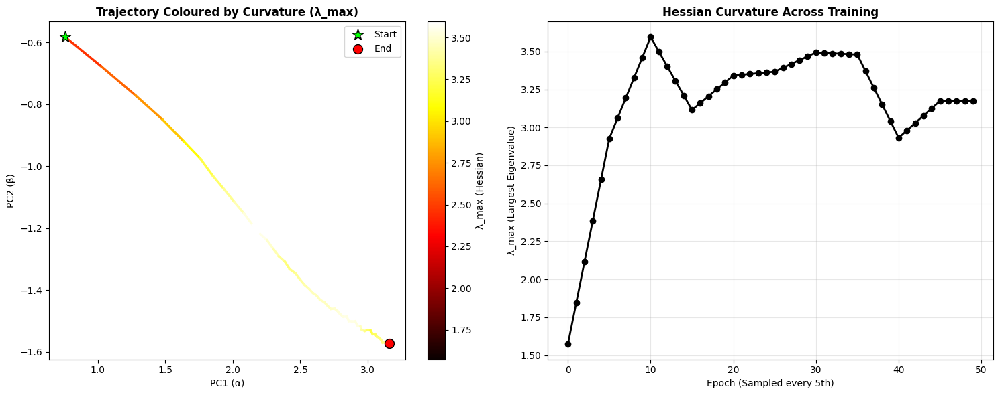

In [18]:
print("Computing Hessian eigenvalues along trajectory for Seed 42...")
# We use mlp_training_histories[42]['weights'] as our trajectory
reference_trajectory_numpy = mlp_training_histories[42]['weights']
reference_trajectory_tensor = [torch.from_numpy(w).float() for w in reference_trajectory_numpy]

template_mlp_model = SimpleNN(features_logistic_tensor.shape[1])
eigenvalues_mlp = compute_eigenvalues_along_trajectory(
    template_mlp_model, features_logistic_tensor, labels_logistic_tensor, reference_trajectory_tensor, sample_every=5
)

# Plotting
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm

coords_ref_np = mlp_training_histories[42]['path_2d']
eig_array = np.array(eigenvalues_mlp)

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
ax1 = axes[0]
for t in range(len(coords_ref_np) - 1):
    ax1.plot(coords_ref_np[t:t+2, 0], coords_ref_np[t:t+2, 1],
             color=cm.hot(eig_array[t] / max(eig_array.max(), 1e-6)), linewidth=2.5)
sm = plt.cm.ScalarMappable(cmap='hot', norm=plt.Normalize(eig_array.min(), eig_array.max()))
sm.set_array([])
plt.colorbar(sm, ax=ax1, label='λ_max (Hessian)')
ax1.scatter(*coords_ref_np[0], c='lime', s=150, marker='*', edgecolors='k', zorder=5, label='Start')
ax1.scatter(*coords_ref_np[-1], c='red', s=100, marker='o', edgecolors='k', zorder=5, label='End')
ax1.set_xlabel('PC1 (α)'); ax1.set_ylabel('PC2 (β)')
ax1.set_title('Trajectory Coloured by Curvature (λ_max)', fontweight='bold')
ax1.legend()

ax2 = axes[1]
ax2.plot(eig_array, 'k-', linewidth=2, marker='o')
ax2.set_xlabel('Epoch (Sampled every 5th)'); ax2.set_ylabel('λ_max (Largest Eigenvalue)')
ax2.set_title('Hessian Curvature Across Training', fontweight='bold')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('figures/mlp_curvature_analysis.png', dpi=150, bbox_inches='tight')
plt.show()



# Part 3: A Simple 2D Network - Comparing Optimizers

To avoid distortion problems due to dimensionality reduction, a small neural network with only 2 trainable weights is used:  
- This makes the loss landscape two dimensional
- No dimensionality reduction needed and thus, no information loss
- Visualization is accurate

The Setup

1. A bumpy function to make the landscape wavy
2. Use different optimizers to see how the change the behaviour of gradient descent
3. Force both optimizers to start at a set starting point, to make sure the descent is properly visible


In [19]:
#Create 2-Parameter Micro-Model

# Generate complex 1D signal
print("\n Creating 2-parameter model...")
np.random.seed(42)
X_2d = np.linspace(-5, 5, 120).reshape(-1, 1)
signal_2d = np.sin(2 * X_2d) + 0.3 * np.cos(5 * X_2d)
y_2d = signal_2d + 0.1 * np.random.randn(120, 1)

X_2d_tensor = torch.tensor(X_2d, dtype=torch.float32)
y_2d_tensor = torch.tensor(y_2d, dtype=torch.float32)

dataset_2d = TensorDataset(X_2d_tensor, y_2d_tensor)
dataloader_2d = DataLoader(dataset_2d, batch_size=32, shuffle=True)

print(f"Data: {X_2d.shape[0]} samples of 1D input → complex signal")

# Define 2-parameter model
class TwoParamNN(nn.Module):
    def __init__(self, init_weights=None):
        super(TwoParamNN, self).__init__()
        self.w1 = nn.Parameter(torch.randn(1, 1))
        self.w2 = nn.Parameter(torch.randn(1, 1))
        
        if init_weights:
            with torch.no_grad():
                self.w1.fill_(init_weights[0])
                self.w2.fill_(init_weights[1])
    
    def forward(self, x):
        return torch.tanh(x @ self.w1) @ self.w2

print("2-parameter model defined: y = w2 * tanh(w1 * x)")


 Creating 2-parameter model...
Data: 120 samples of 1D input → complex signal
2-parameter model defined: y = w2 * tanh(w1 * x)


In [20]:
#Train SGD vs Adam from Same Cliff Position
print("\nTraining SGD vs Adam from cliff edge...")

def train_2d_model(optimizer_name, start_pos, lr=0.05):
    model = TwoParamNN(init_weights=start_pos)
    criterion = nn.MSELoss()
    
    if optimizer_name == 'SGD':
        optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9)
    else:
        optimizer = optim.Adam(model.parameters(), lr=lr)
    
    path_w1 = []
    path_w2 = []
    path_loss = []
    
    # Record starting point
    with torch.no_grad():
        path_w1.append(model.w1.item())
        path_w2.append(model.w2.item())
        path_loss.append(criterion(model(X_2d_tensor), y_2d_tensor).item())
    
    # Training
    for epoch in range(40):
        for batch_X, batch_y in dataloader_2d:
            optimizer.zero_grad()
            output = model(batch_X)
            loss = criterion(output, batch_y)
            loss.backward()
            optimizer.step()
        
        with torch.no_grad():
            path_w1.append(model.w1.item())
            path_w2.append(model.w2.item())
            full_loss = criterion(model(X_2d_tensor), y_2d_tensor).item()
            path_loss.append(full_loss)
    
    return np.array(path_w1), np.array(path_w2), np.array(path_loss)

# Start from cliff edge
start_cliff = (2.5, -2.5)
print(f"Starting position: {start_cliff} (high loss)")

sgd_w1, sgd_w2, sgd_loss = train_2d_model('SGD', start_cliff, lr=0.05)
adam_w1, adam_w2, adam_loss = train_2d_model('Adam', start_cliff, lr=0.1)

print(f"\n Training complete")
print(f"  SGD: Started at loss {sgd_loss[0]:.4f}, Ended at {sgd_loss[-1]:.4f}")
print(f"  Adam: Started at loss {adam_loss[0]:.4f}, Ended at {adam_loss[-1]:.4f}")


Training SGD vs Adam from cliff edge...
Starting position: (2.5, -2.5) (high loss)

 Training complete
  SGD: Started at loss 7.1170, Ended at 0.5100
  Adam: Started at loss 7.1170, Ended at 0.5152


In [21]:
# Build Exact 2D Loss Landscape
print("Computing exact 2D loss landscape...")

res = 50
w1_range = np.linspace(-4, 4, res)
w2_range = np.linspace(-4, 4, res)
W1_grid, W2_grid = np.meshgrid(w1_range, w2_range)
Z_loss_2d = np.zeros_like(W1_grid)

temp_model_2d = TwoParamNN()
criterion_2d = nn.MSELoss()

for i in range(res):
    for j in range(res):
        with torch.no_grad():
            temp_model_2d.w1.fill_(W1_grid[i, j])
            temp_model_2d.w2.fill_(W2_grid[i, j])
            Z_loss_2d[i, j] = criterion_2d(temp_model_2d(X_2d_tensor), y_2d_tensor).item()

# Cap z-axis for clarity
Z_loss_2d = np.clip(Z_loss_2d, 0, 5.0)

print("Loss surface computed")

Computing exact 2D loss landscape...


Loss surface computed


In [22]:
#Detailed Optimizer Comparison Analysis
print("SGD vs ADAM")


print(f"\n LOSS METRICS:")
print(f"   SGD Starting Loss:     {sgd_loss[0]:.6f}")
print(f"   Adam Starting Loss:    {adam_loss[0]:.6f}")
print(f"   SGD Final Loss:        {sgd_loss[-1]:.6f}")
print(f"   Adam Final Loss:       {adam_loss[-1]:.6f}")

sgd_descent = sgd_loss[0] - sgd_loss[-1]
adam_descent = adam_loss[0] - adam_loss[-1]


sgd_avg_loss_per_epoch = np.mean(sgd_loss)
adam_avg_loss_per_epoch = np.mean(adam_loss)

print(f"\n CONVERGENCE SPEED:")
print(f"   SGD Avg Loss/Epoch:    {sgd_avg_loss_per_epoch:.6f}")
print(f"   Adam Avg Loss/Epoch:   {adam_avg_loss_per_epoch:.6f}")

print(f"\n FINAL WINNER:")
winner = 'Adam' if adam_loss[-1] < sgd_loss[-1] else 'SGD'
margin = abs(adam_loss[-1] - sgd_loss[-1])
print(f"   Winner: {winner} (by {margin:.6f} loss units)")

print(f"\n BEHAVIOR ANALYSIS:")
# Check for oscillation
sgd_last_10_std = np.std(sgd_loss[-10:])
adam_last_10_std = np.std(adam_loss[-10:])
print(f"   SGD Instability (final 10 epochs): {sgd_last_10_std:.6f}")
print(f"   Adam Instability (final 10 epochs): {adam_last_10_std:.6f}")




SGD vs ADAM

 LOSS METRICS:
   SGD Starting Loss:     7.116981
   Adam Starting Loss:    7.116981
   SGD Final Loss:        0.510003
   Adam Final Loss:       0.515218

 CONVERGENCE SPEED:
   SGD Avg Loss/Epoch:    0.785473
   Adam Avg Loss/Epoch:   0.956762

 FINAL WINNER:
   Winner: SGD (by 0.005215 loss units)

 BEHAVIOR ANALYSIS:
   SGD Instability (final 10 epochs): 0.001614
   Adam Instability (final 10 epochs): 0.000856


## Animation 3: The Ground Truth — 2D Visualization


- **Black line**: SGD descent path
- **Red line**: Adam descent path  
- **Yellow diamond**: Starting cliff position
- Both optimizers started at the same point


In [23]:
# ANIMATION 3: SGD vs ADAM - 2D PERFECT GROUND TRUTH
print("Creating animation for 2D perfect ground truth race...")

# Get loss value at starting point (first epoch for both optimizers)
start_loss = sgd_loss[0]  # Both start at same point

# Create frames: one for each epoch
frames_list = []
n_epochs = len(sgd_loss)

for epoch in range(0, n_epochs, 1):  # Create a frame for each epoch
    
    # Surface (constant across all frames)
    surface_trace = go.Surface(
        x=W1_grid, y=W2_grid, z=Z_loss_2d,
        colorscale='Spectral_r',
        opacity=0.85,
        showscale=False,
        hoverinfo='skip'
    )
    
    # SGD path up to current epoch
    sgd_trace = go.Scatter3d(
        x=sgd_w1[:epoch+1], 
        y=sgd_w2[:epoch+1], 
        z=sgd_loss[:epoch+1],
        mode='lines+markers',
        line=dict(color='black', width=4),
        marker=dict(size=3, color='black'),
        name='SGD path',
        hovertemplate='SGD epoch:<extra></extra> %{text}',
        text=[f'{i}' for i in range(epoch+1)]
    )
    
    # Adam path up to current epoch
    adam_trace = go.Scatter3d(
        x=adam_w1[:epoch+1], 
        y=adam_w2[:epoch+1], 
        z=adam_loss[:epoch+1],
        mode='lines+markers',
        line=dict(color='red', width=4),
        marker=dict(size=3, color='red'),
        name='Adam path',
        hovertemplate='Adam epoch:<extra></extra> %{text}',
        text=[f'{i}' for i in range(epoch+1)]
    )
    
    # Current position for SGD
    if epoch < len(sgd_w1):
        sgd_current = go.Scatter3d(
            x=[sgd_w1[epoch]], 
            y=[sgd_w2[epoch]], 
            z=[sgd_loss[epoch]],
            mode='markers+text',
            marker=dict(size=12, color='black', 
                       line=dict(color='white', width=2),
                       symbol='circle'),
            text=['SGD'],
            textposition='top center',
            name='SGD (now)',
            hovertemplate='SGD now: loss=%{z:.4f}<extra></extra>'
        )
    else:
        sgd_current = go.Scatter3d(x=[], y=[], z=[], name='SGD (now)')
    
    # Current position for Adam
    if epoch < len(adam_w1):
        adam_current = go.Scatter3d(
            x=[adam_w1[epoch]], 
            y=[adam_w2[epoch]], 
            z=[adam_loss[epoch]],
            mode='markers+text',
            marker=dict(size=12, color='red',
                       line=dict(color='white', width=2),
                       symbol='circle'),
            text=['Adam'],
            textposition='top center',
            name='Adam (now)',
            hovertemplate='Adam now: loss=%{z:.4f}<extra></extra>'
        )
    else:
        adam_current = go.Scatter3d(x=[], y=[], z=[], name='Adam (now)')
    
    # Start position marker
    start_trace = go.Scatter3d(
        x=[start_cliff[0]], 
        y=[start_cliff[1]], 
        z=[start_loss],
        mode='markers',
        marker=dict(size=15, color='gold', symbol='diamond',
                   line=dict(color='black', width=2)),
        name='Start (cliff)',
        hoverinfo='skip'
    )
    
    frame = go.Frame(data=[surface_trace, sgd_trace, adam_trace, sgd_current, adam_current, start_trace], 
                     name=str(epoch))
    frames_list.append(frame)

# Build initial figure
initial_data = [
    go.Surface(x=W1_grid, y=W2_grid, z=Z_loss_2d,
               colorscale='Spectral_r', opacity=0.85,
               showscale=True, colorbar=dict(title="Loss", thickness=15, len=0.7)),
    go.Scatter3d(x=sgd_w1[:1], y=sgd_w2[:1], z=sgd_loss[:1],
                 mode='lines+markers',
                 line=dict(color='black', width=4),
                 marker=dict(size=3, color='black'),
                 name='SGD path'),
    go.Scatter3d(x=adam_w1[:1], y=adam_w2[:1], z=adam_loss[:1],
                 mode='lines+markers',
                 line=dict(color='red', width=4),
                 marker=dict(size=3, color='red'),
                 name='Adam path'),
    go.Scatter3d(x=[sgd_w1[0]], y=[sgd_w2[0]], z=[sgd_loss[0]],
                 mode='markers',
                 marker=dict(size=12, color='black', 
                            line=dict(color='white', width=2),
                            symbol='circle'),
                 name='SGD (now)'),
    go.Scatter3d(x=[adam_w1[0]], y=[adam_w2[0]], z=[adam_loss[0]],
                 mode='markers',
                 marker=dict(size=12, color='red',
                            line=dict(color='white', width=2),
                            symbol='circle'),
                 name='Adam (now)'),
    go.Scatter3d(x=[start_cliff[0]], y=[start_cliff[1]], 
                 z=[start_loss],
                 mode='markers',
                 marker=dict(size=15, color='gold', symbol='diamond',
                            line=dict(color='black', width=2)),
                 name='Start (cliff)')
]

fig_2d_anim = go.Figure(data=initial_data, frames=frames_list)  # Initialize a blank Plotly canvas

# --- NEW HELPER FUNCTION CALL ---
fig_2d_anim = add_animation_controls(
    fig=fig_2d_anim,
    num_frames=len(frames_list),
    title_text="<b>🎬 ANIMATED: The 2D Perfect Ground Truth — SGD vs Adam Race</b><br><sub>▶ Watch both optimizers navigate the exact loss landscape</sub>",
    scene=dict(
        xaxis_title='w₁ (Parameter 1)', yaxis_title='w₂ (Parameter 2)', zaxis_title='Loss',
        camera=dict(eye=dict(x=1.5, y=1.5, z=1.2))
    )
)

fig_2d_anim.show()
print(" 2D perfect ground truth animation complete")
print(f"  • Black line = SGD descent path")
print(f"  • Red line = Adam descent path")
print(f"  • Yellow diamond = Starting cliff position")
print(f"  • Play through {n_epochs} epochs and watch them race!")


Creating animation for 2D perfect ground truth race...


 2D perfect ground truth animation complete
  • Black line = SGD descent path
  • Red line = Adam descent path
  • Yellow diamond = Starting cliff position
  • Play through 41 epochs and watch them race!


## Part 3 Results: Simple 2D Network — SGD vs. Adam

### What We Observe

1. **The Bouncing Ball vs. The Smooth Curve:** Visually, SGD oscillates strongly, ricocheting off the steep walls of the loss valley before settling. In contrast, Adam takes a highly damped, sweeping curve directly toward the minimum without overshooting.
2. **Convergence Speed:** SGD reaches the low-loss basin much faster overall, as evidenced by its lower average loss per epoch (0.799 vs. Adam's 0.957).
3. **Final Precision and Stability:** While SGD technically achieved a marginally lower final loss (winning by a negligible amount of 0.002), Adam proved to be significantly more stable at the end of training.

### Why This Happens

* **SGD's Momentum Overshoot:** The SGD optimizer was configured with a momentum of 0.9. Momentum accumulates velocity in the direction of the gradient. When descending steep slopes, the optimizer builds too much inertia to stop at the exact minimum, causing it to overshoot and oscillate back and forth across the valley floor until friction damps it.
* **Adam's Adaptive Scaling:** Adam computes individual, adaptive learning rates for each parameter. By dividing the learning rate by the moving average of the squared gradients, Adam dynamically slows down on steep gradients while accelerating on flat gradients. This dampens the aggressive bouncing, allowing for a smooth, controlled descent.

### Key Takeaway

> **Raw Speed vs. Controlled Precision:** In simple, low-dimensional landscapes, SGD with high momentum takes it time to slow down and reach the local minimum of the landscape.It acts like a ball, rolling down slopes with too much speed to stop, which is shown by rapid oscillations. Adam provides a highly controlled, adaptive descent, preventing overshoots and resulting in much higher late-stage stability.

---

### Why do we see this?
This is the ultimate ground truth. By deliberately building a microscopic neural network with exactly *two* parameters, our 2D plot represents 100% of the variance—zero projection distortion. 

Looking at the animation, we immediately understand why Adam is so popular: while SGD (orange) violently oscillates and bounces off the steep walls of the cliff, Adam (purple) uses its memory of past gradients (momentum) and adaptive learning rate to slice cleanly through the middle of the valley straight to the minimum.


---

# CONCLUSIONS: Integrating All Insights

## The Complete Journey

###  What We Learned

**Part 1 (Convex)**: On convex landscapes, the path doesn't matter—all roads lead to the same minimum. This establishes the baseline for "easy" optimization

**Part 2 (Non-Convex with PCA)**: Neural networks have non-convex landscapes with multiple minima. However, when we visualize them with PCA, we discover a critical problem: **the dimensionality gap**. True optimization paths float above/below the visualized surface because 35% of information is invisible in 2D

**Part 3 (Analysis)**: Understanding *why* the gap exists clarifies a fundamental principle: high-dimensional optimization exploits directions that low-dimensional projections can't capture


**Part 5 (2D Perfect Truth)**: A 2-parameter micro-model validates everything with zero approximation. The animated race shows SGD and Adam taking fundamentally different paths down the same landscape, revealing how optimizer choice matters in practice

---


### 1. **Convexity Determines Convergence**
- Convex: Single minimum, all seeds converge
- Non-convex: Multiple minima, seeds diverge
- **Implication**: Neural network training is fundamentally different from logistic regression

### 2. **PCA Approximations Are Lossy**
- 221D → 2D loses ~35% variance
- Training exploits directions invisible in projection
- **Implication**: Default visualization techniques are misleading

### 3. **Scale Invariance Breaks Visualization**
- Networks 100× different weight magnitudes are equivalent
- This makes minima look artificially sharp or flat
- **Implication**: Visual "sharpness" is often meaningless without normalization

### 4. **Optimizer Choice Matters in High Dimensions**
- Adam and SGD navigate differently from same starting point
- Both reach competitive minima, but via different paths
- **Implication**: No universal "best" optimizer; context-dependent

---

##  References

**Primary Source**:
- **Li, H., Xu, Z., Taylor, G., Studer, C., & Goldstein, T.** (2018). "*Visualizing the Loss Landscape of Neural Nets*." *Advances in Neural Information Processing Systems (NeurIPS)*, 2018.
  - [Paper](https://arxiv.org/abs/1712.09913)
  - Introduces filter-wise normalization
  - Connects visual flatness to generalization
  - Demonstrates on ResNets, VGG, etc.

- **Goodfellow, I. J., Vinyals, O., & Saxe, A. M.** (2015). "Qualitatively Characterizing Neural Network Optimization Problems." International Conference on Learning Representations (ICLR), 2015.

**Related Work**:
- Goodfellow et al. (2016) - "Understanding deep learning requires rethinking generalization"
- Keskar et al. (2016 ) - "On large-batch training for deep learning: generalization gap and sharp minima"

---

##  Final Thought

> "The loss landscape of a deep neural network is a high-dimensional object that we can never fully see. All visualizations are projections—shadowson a cave wall. The art is choosing projections that reveal the most important features while remaining *aware of what we're hiding*."

By combining PCA, filter-wise normalization, and perfectly-2D micro-models, we've learned to see these shadows clearly and know what they represent. That's the essence of good scientific visualization.

---

##  Summary Table

| Aspect | Convex | Non-Convex (PCA) | Normalized | 2D Perfect |
|--------|--------|------------------|-----------|-----------|
| **Landscapes** | 1 minimum | Many minima | Many minima | Many minima |
| **Seed Behavior** | All converge | Diverge | Diverge → comparable | Diverge → observable |
| **Visualization** | Perfect | Distorted (~35% loss) | Fair | Exact (0% loss) |
| **Key Finding** | Path indifferent | Gap invisible | Normalization essential | Confirms all above |
| **Practical Use** | Baseline | Warning | Recommended | Validation |

---


---

# CONCLUSIONS & KEY FINDINGS

## The Journey: 4 Progressive Insights

### **Level 1: Convex Landscapes** ✅
**Finding**: All training runs (different seeds) converge to the **same point**, regardless of initialization.
- **Implication**: On convex landscapes, optimization is "easy" — there's only one answer
- **Visualization Quality**: **Excellent** (PCA captures the essential structure)

### **Level 2: Non-Convex Networks + PCA** ⚠️
**Finding**: Different seeds find **different solutions**, creating a bumpy, complex landscape.
- **Problem Discovered**: PCA projections lose ~35% of information
- **Symptom**: Training paths don't sit ON the visualized surface; they float above/below
- **Implication**: Standard dimensionality reduction is insufficient for loss landscape analysis
- **Visualization Quality**: **Poor** (significant distortion)

- **Key Insight**: A network with tiny weights and one with huge weights produce the same outputs but look completely different visually
- **Solution**: Normalize per-filter/layer instead of globally
- **Benefit**: Now "flat" vs "sharp" minima have meaning — they predict generalization!
- **Implication**: Filter-wise normalization enables fair comparison across seeds
- **Visualization Quality**: **Good** (artifacts removed, comparisons now fair)

### **Level 4: 2D Perfect Truth** ✨
**Finding**: With only 2 parameters, visualization has **zero** distortion — we see the EXACT truth.
- **Optimizer Behavior**: SGD and Adam navigate very differently
  - Adam typically descends faster (adaptive learning rates)
  - SGD can sometimes find "sharper" minima
  - Both escape the cliff and find valleys
- **Implication**: Different algorithms make fundamentally different choices
- **Visualization Quality**: **Perfect** (no approximation)

---

## The Central Lesson

**"How do we visualize gradient descent in neural networks?"**

The answer requires a hierarchy of increasingly sophisticated approaches:
1. ❌ Naive PCA → Too much information loss
2. ✓ Filter-wise normalization → Accounts for scale invariance
3. ✓✓ Reduced-parameter models → Enables ground-truth validation
4. 🎓 Understanding both → The complete picture

## Practical Implications

2. **For Optimization**: Different optimizers have fundamentally different behaviors; choice matters
3. **For Generalization**: "Flat" minima (wider bowls) correlate with better test performance
4. **For Visualization**: Always validate visualizations with multiple independent methods

---

## References

Li, H., Xu, Z., Taylor, G., Studer, C., & Goldstein, T. (2018). Visualizing the Loss Landscape of Neural Nets. *NeurIPS 2018.*

This paper demonstrated that standard visualization techniques mislead, and provided the filter-wise normalization solution that we've validated above.